In [1]:
import pandas as pd # For creating dataframes and calculating correlation matrices.
from pandas.api.types import CategoricalDtype # For correctly setting some dataframe colummns as being of categorical type

from pathlib import Path # For defining the path directory in which the data is stored

import seaborn as sn   # For creating visual representations
import matplotlib
import matplotlib.pyplot as plt # of correlation matrices.

import numpy as np #For numerical opertions

import networkx as nx
#import community as community_louvain
import matplotlib.cm as cm


In [16]:
cdata_mex_pairs=pd.read_csv('../output_data/complexity_data_mex_pairs_all.csv')

low_range = 0.5 # Strong transition
low_range_str = str(low_range).replace('.','_')
#RCA weighted metrics
cdata_mex_pairs['GPDperCAP_rca1']=cdata_mex_pairs['GPDperCAP']*cdata_mex_pairs['rca1']
cdata_mex_pairs['discovery_factor_rca1']=cdata_mex_pairs['discovery_factor_'+low_range_str]*cdata_mex_pairs['rca1']
cdata_mex_pairs['degree_centrality_rca1']=cdata_mex_pairs['degree_centrality']*cdata_mex_pairs['rca1']
cdata_mex_pairs['eigenvecor_centrality_rca1']=cdata_mex_pairs['eigenvecor_centrality']*cdata_mex_pairs['rca1']
cdata_mex_pairs['closeness_centrality_rca1']=cdata_mex_pairs['closeness_centrality']*cdata_mex_pairs['rca1']


cdata_mex_pairs_under_trans=cdata_mex_pairs.loc[cdata_mex_pairs['M_num_'+low_range_str].isin([0,1])]
cdata_mex_pairs_under_trans

,Unnamed: 0.1,Unnamed: 0,year_pair,location_code,Product,export,eci,pci,density,coi,...,discovery_factor_0_95,discovery_factor_1,degree_centrality,eigenvecor_centrality,closeness_centrality,GPDperCAP_rca1,discovery_factor_rca1,degree_centrality_rca1,eigenvecor_centrality_rca1,closeness_centrality_rca1
0,0,0,2004_2009,Aguascalientes,112511,0.0,0.256317,-1.921854,0.324795,0.742236,...,1.399113,1.399113,0.609355,0.027170,0.719091,0.0,0.0,0.0,0.0,0.0
1,1,1,2004_2009,Aguascalientes,112512,0.0,0.256317,-1.381170,0.375059,0.742236,...,1.874312,1.874312,0.849558,0.037179,0.869231,0.0,0.0,0.0,0.0,0.0
2,2,2,2004_2009,Aguascalientes,114111,0.0,0.256317,-2.459290,0.341204,0.742236,...,1.607370,1.607370,0.700379,0.030799,0.769455,0.0,0.0,0.0,0.0,0.0
3,3,3,2004_2009,Aguascalientes,114112,0.0,0.256317,-1.305625,0.265136,0.742236,...,1.113494,1.113494,0.523388,0.023113,0.677226,0.0,0.0,0.0,0.0,0.0
4,4,4,2004_2009,Aguascalientes,114113,0.0,0.256317,1.981890,0.240150,0.742236,...,0.000000,0.000000,0.395702,0.017599,0.623325,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101427,101427,101427,2004_2019,Zacatecas,721312,0.0,-0.963458,-1.439591,0.293033,-0.546682,...,1.155311,1.155311,0.706700,0.031097,0.773216,0.0,0.0,0.0,0.0,0.0
101428,101428,101428,2004_2019,Zacatecas,722310,0.0,-0.963458,3.006042,0.163474,-0.546682,...,2.165853,2.165853,0.898862,0.038590,0.908152,0.0,0.0,0.0,0.0,0.0
101429,101429,101429,2004_2019,Zacatecas,722320,0.0,-0.963458,0.219078,0.289040,-0.546682,...,2.532371,2.060019,0.941846,0.040238,0.945042,0.0,0.0,0.0,0.0,0.0
101449,101449,101449,2004_2019,Zacatecas,811313,0.0,-0.963458,1.237497,0.233178,-0.546682,...,2.061195,1.854317,0.938053,0.040004,0.941667,0.0,0.0,0.0,0.0,0.0


In [17]:
Estados = cdata_mex_pairs['location_code'].unique()
Estados

array(['Aguascalientes', 'Baja California', 'Baja California Sur',
       'Campeche', 'Chiapas', 'Chihuahua', 'Ciudad de México', 'Coahuila',
       'Colima', 'Durango', 'Guanajuato', 'Guerrero', 'Hidalgo',
       'Jalisco', 'México', 'Michoacán', 'Morelos', 'Nayarit',
       'Nuevo León', 'Oaxaca', 'Puebla', 'Querétaro', 'Quintana Roo',
       'San Luis Potosí', 'Sinaloa', 'Sonora', 'Tabasco', 'Tamaulipas',
       'Tlaxcala', 'Veracruz', 'Yucatán', 'Zacatecas'], dtype=object)

Aguascalientes


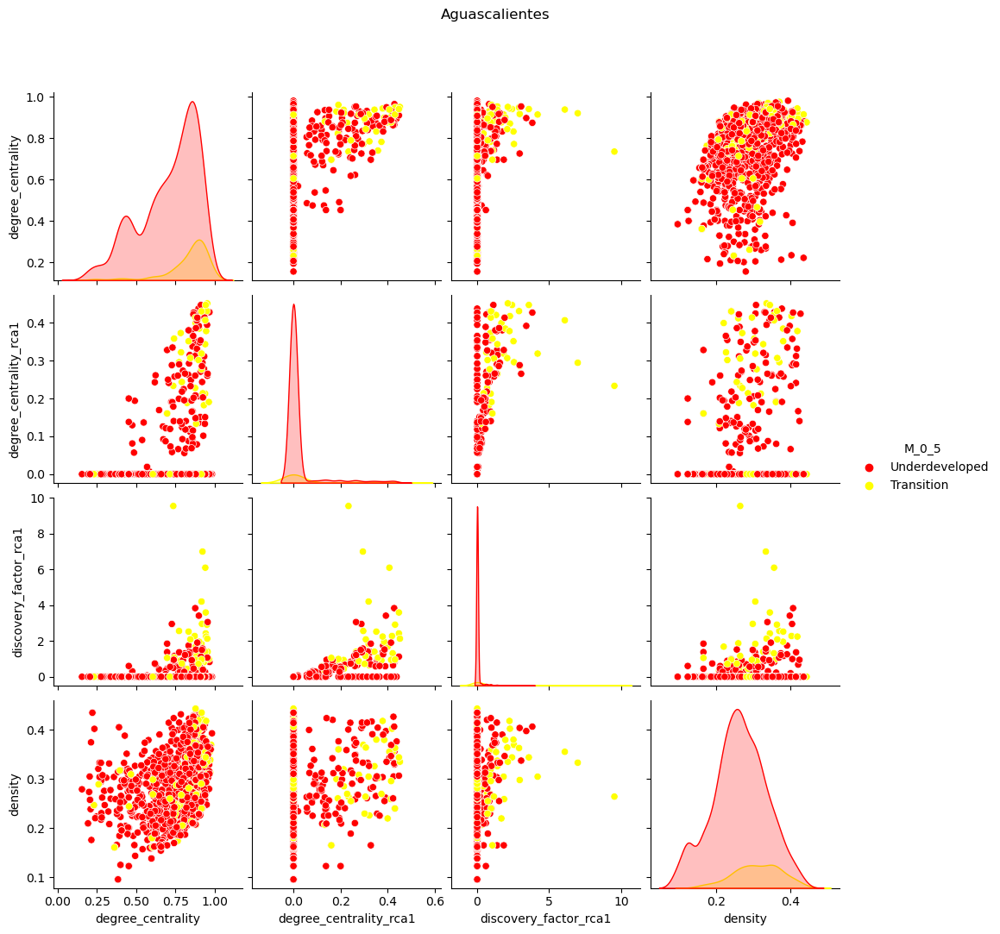

In [18]:
Edo = 'Aguascalientes'
Feature_array = ['degree_centrality','degree_centrality_rca1','discovery_factor_rca1','density','M_'+low_range_str]
Visualize_df = cdata_mex_pairs_under_trans[cdata_mex_pairs_under_trans['location_code'] == Edo][Feature_array]
print(Edo)
sn.pairplot(Visualize_df, hue='M_'+low_range_str,palette = {'Underdeveloped':'red','Transition':'yellow'}).fig.suptitle(Edo, y=1.08)
plt.show()


Aguascalientes


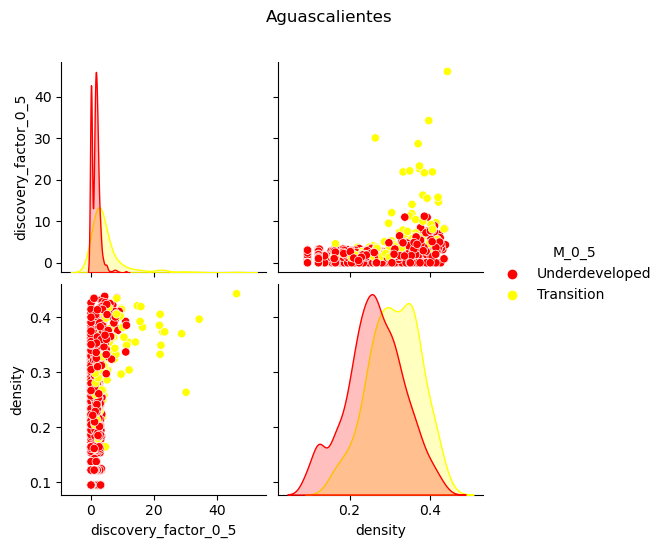

Baja California


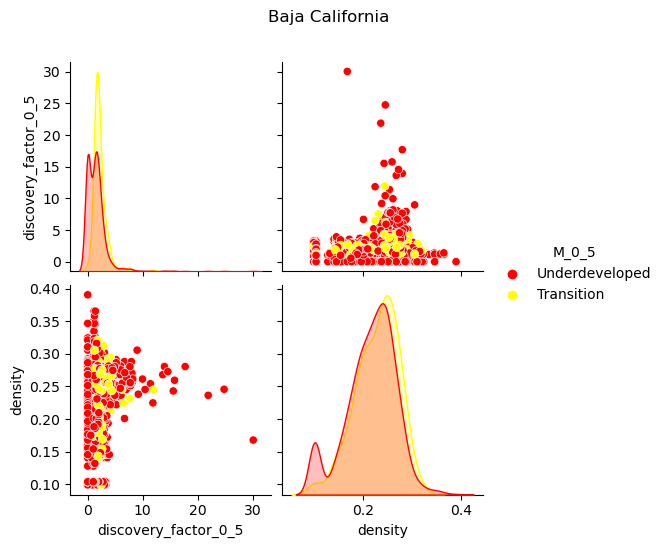

Baja California Sur


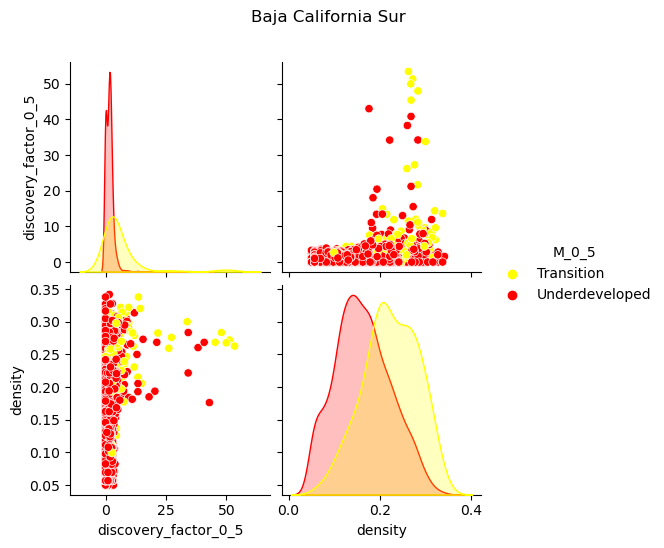

Campeche


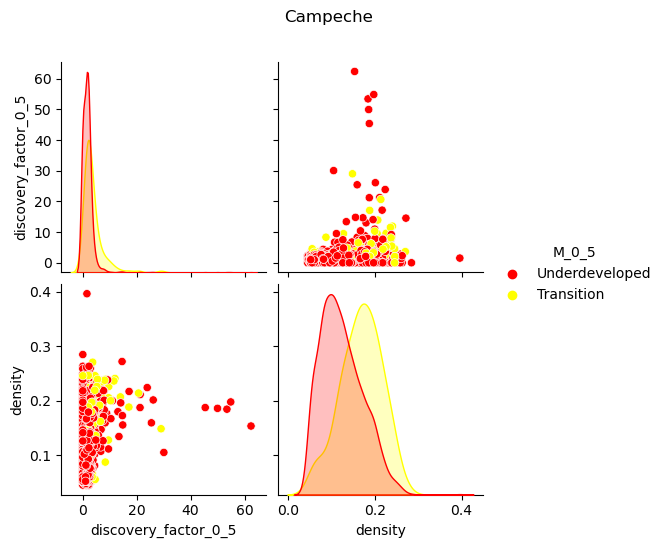

Chiapas


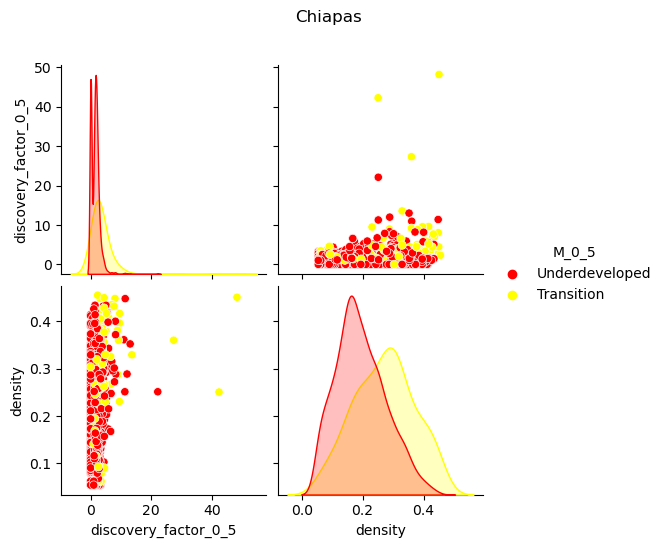

Chihuahua


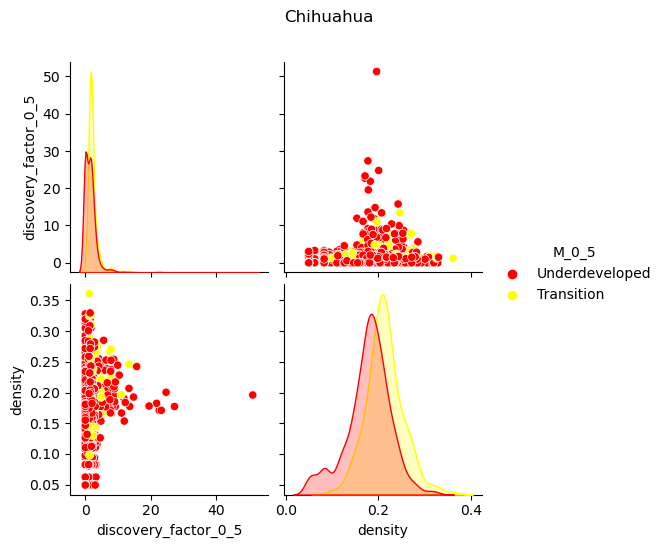

Ciudad de México


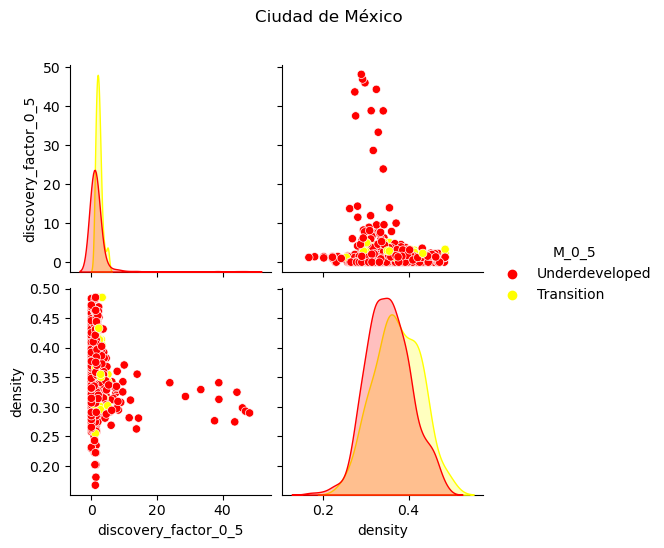

Coahuila


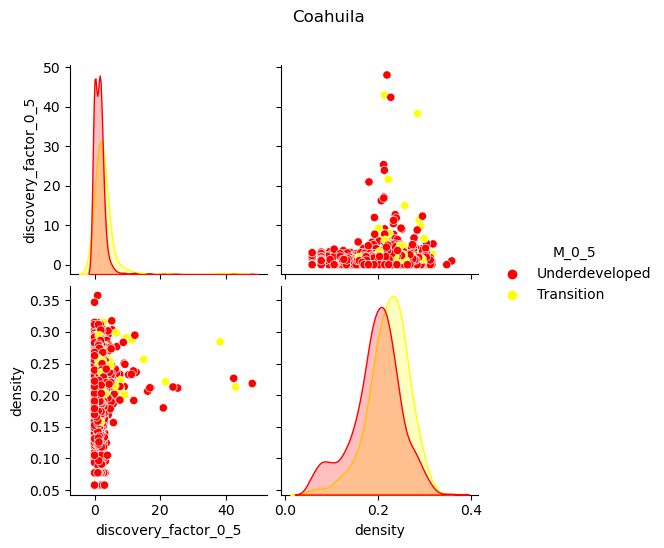

Colima


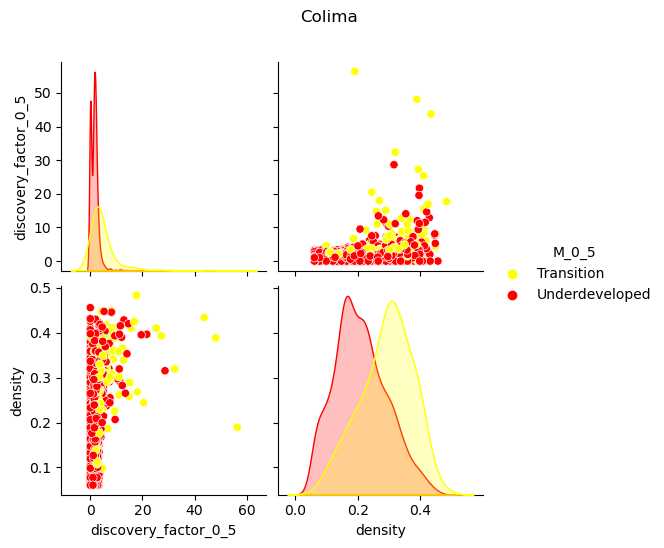

Durango


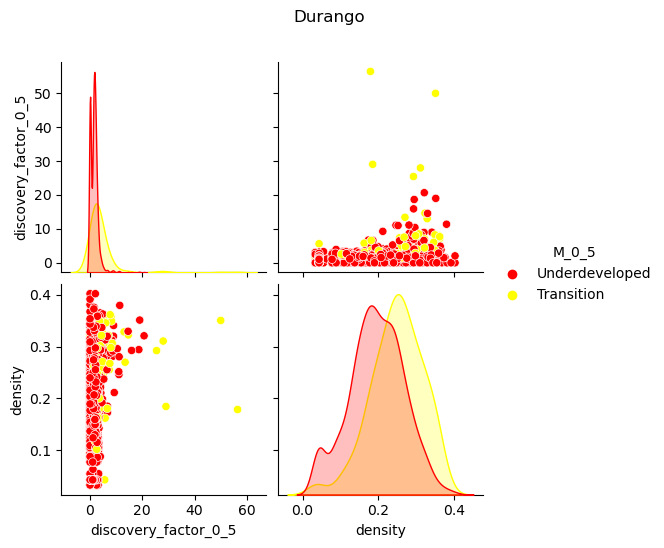

Guanajuato


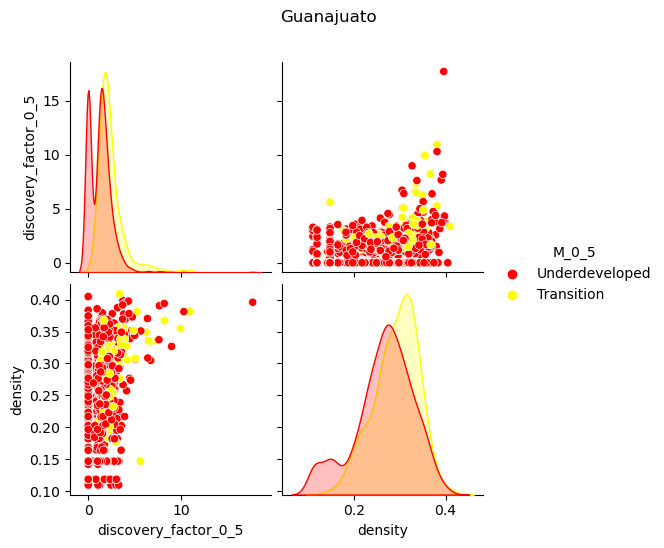

Guerrero


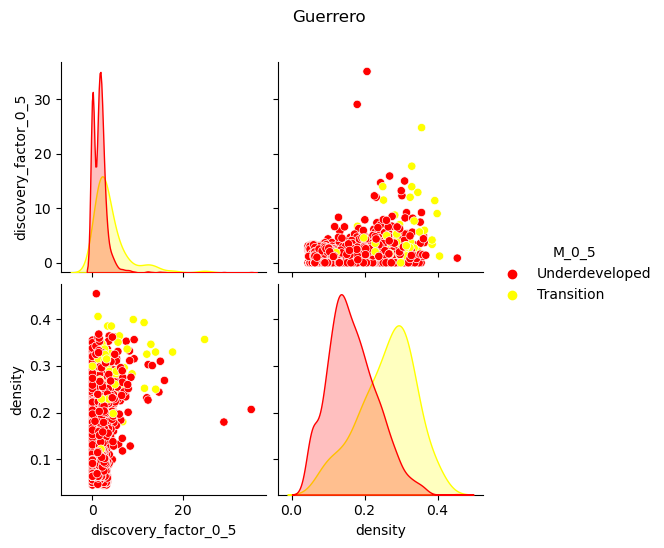

Hidalgo


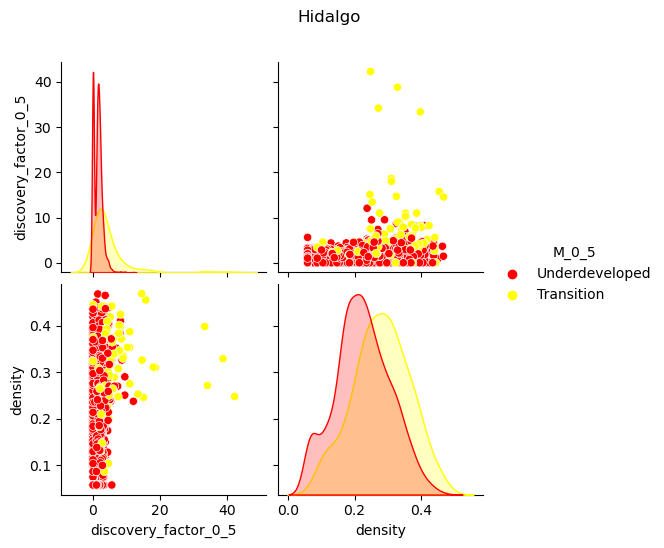

Jalisco


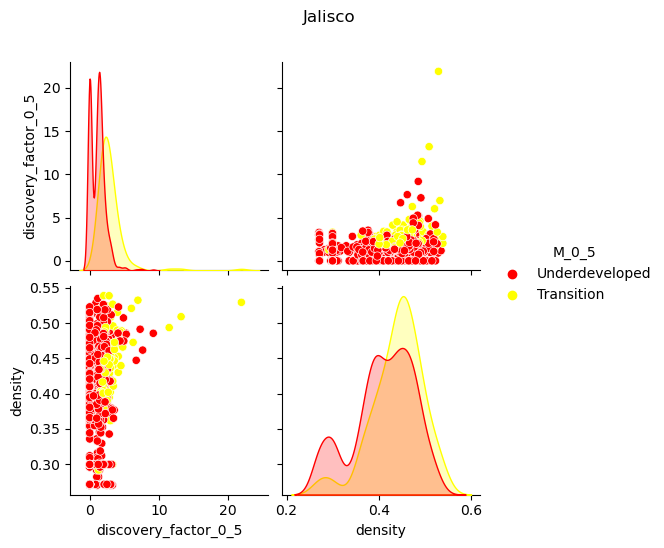

México


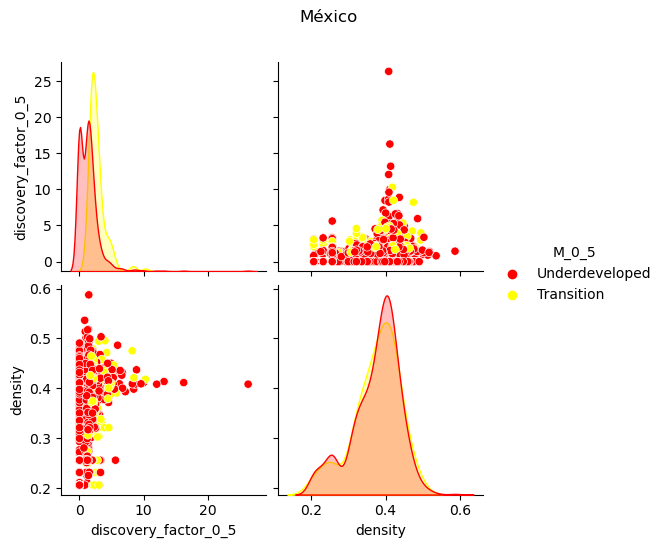

Michoacán


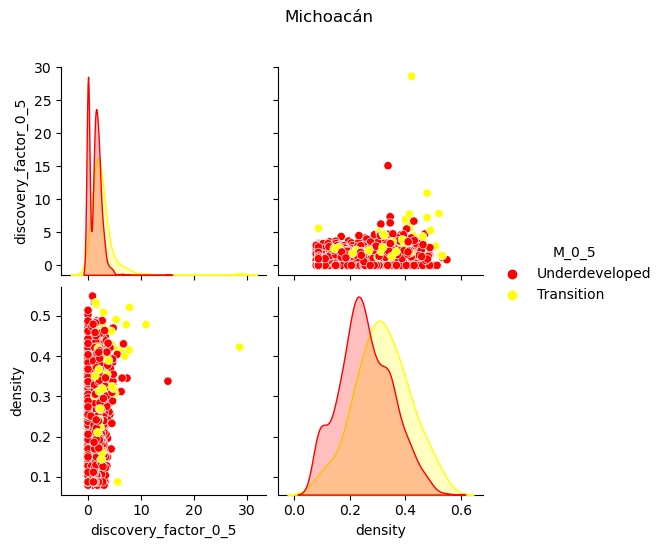

Morelos


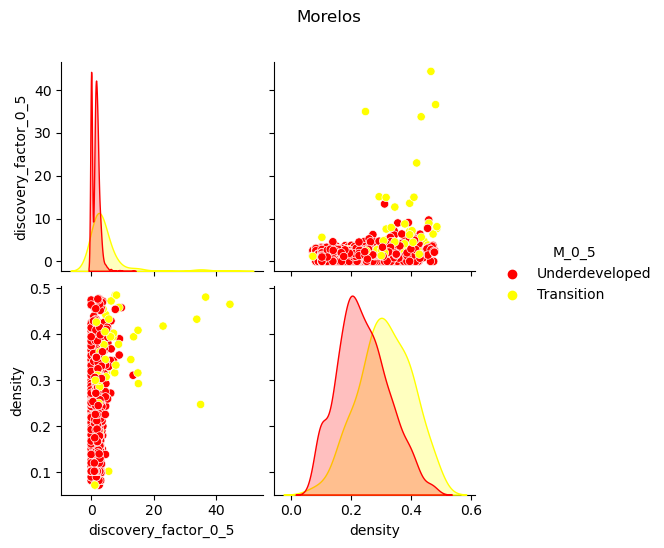

Nayarit


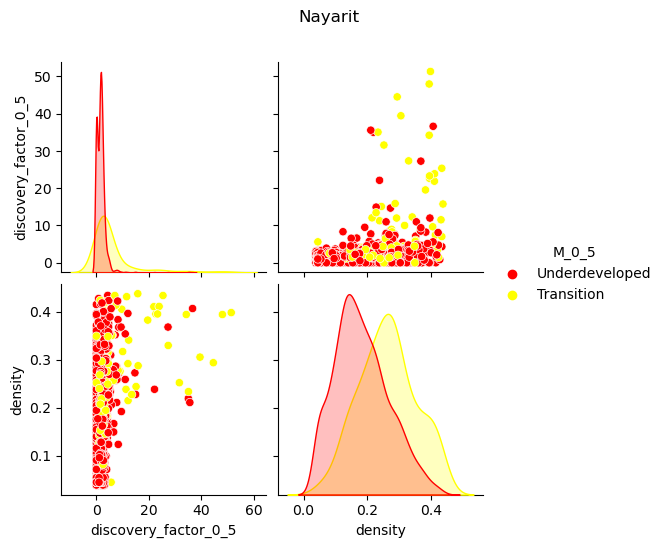

Nuevo León


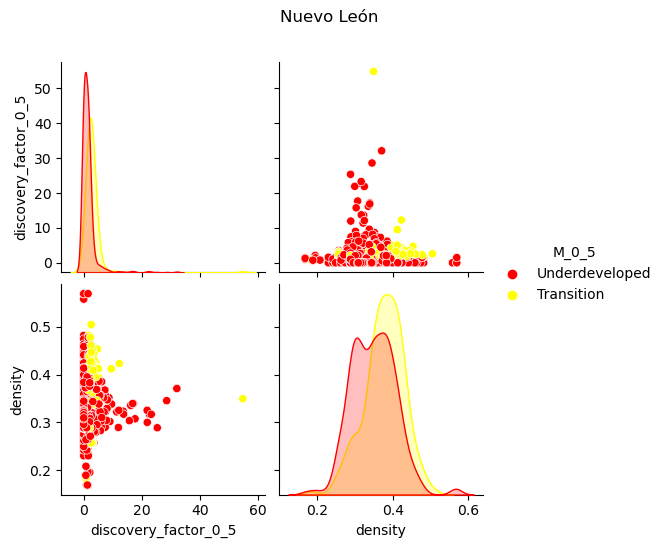

Oaxaca


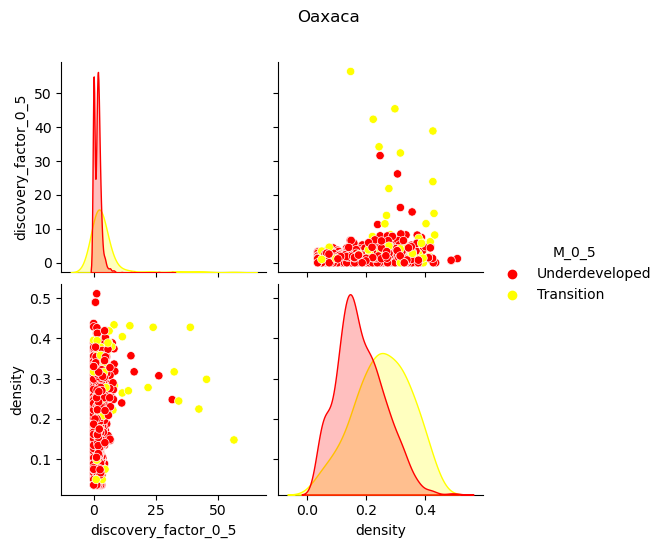

Puebla


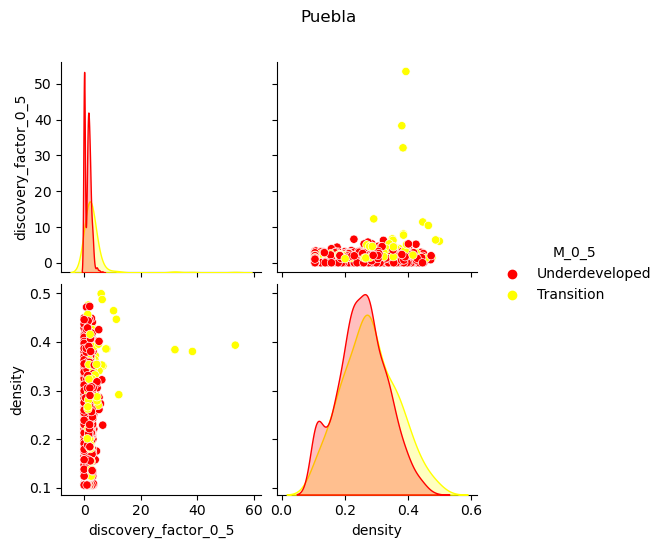

Querétaro


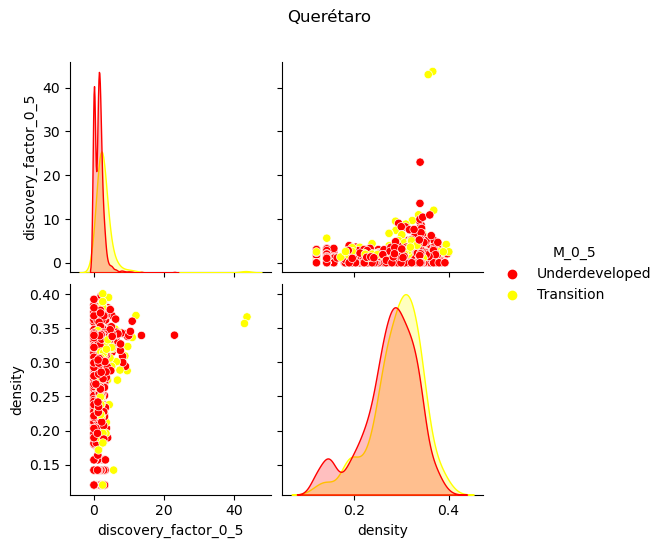

Quintana Roo


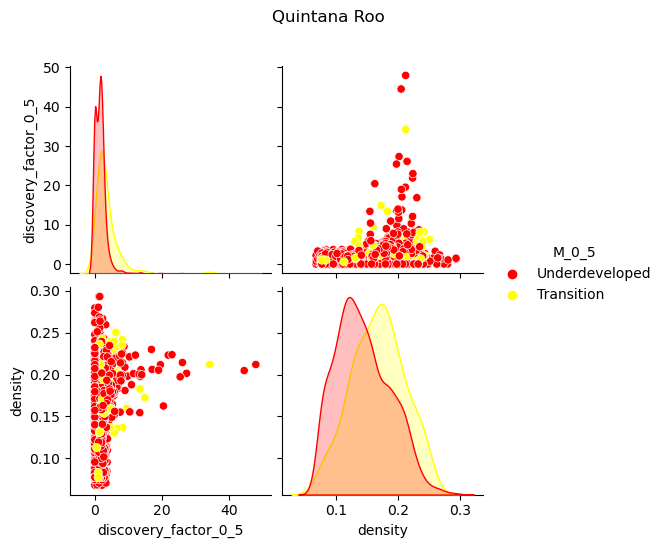

San Luis Potosí


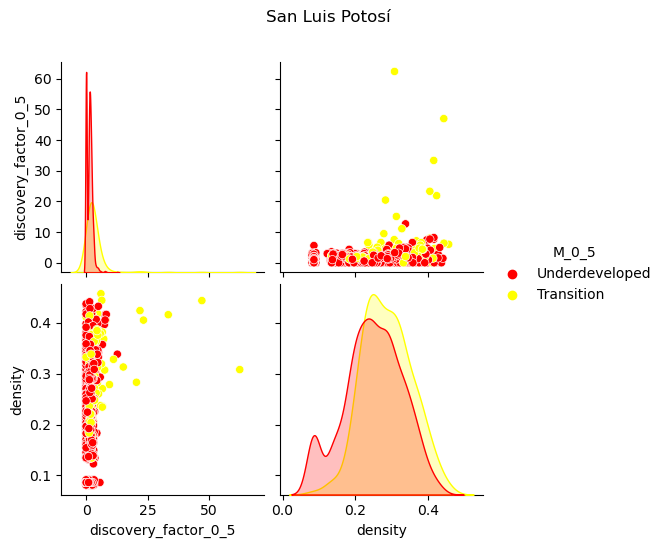

Sinaloa


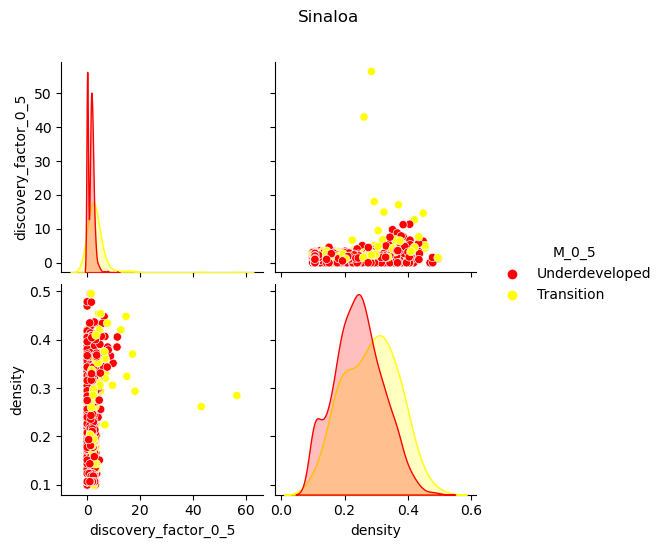

Sonora


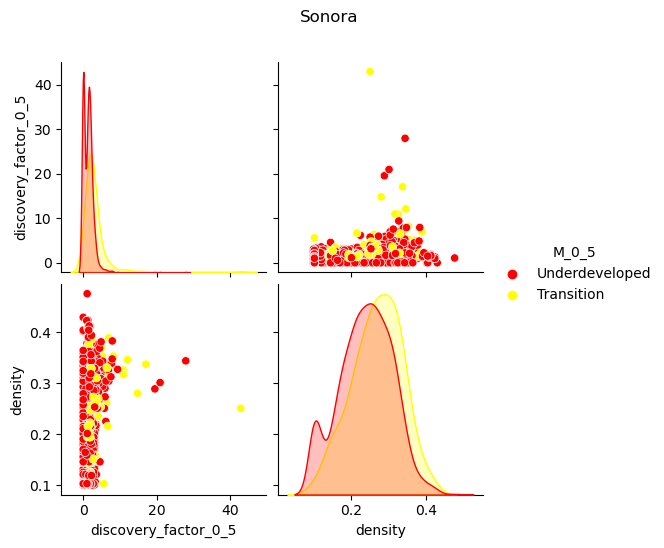

Tabasco


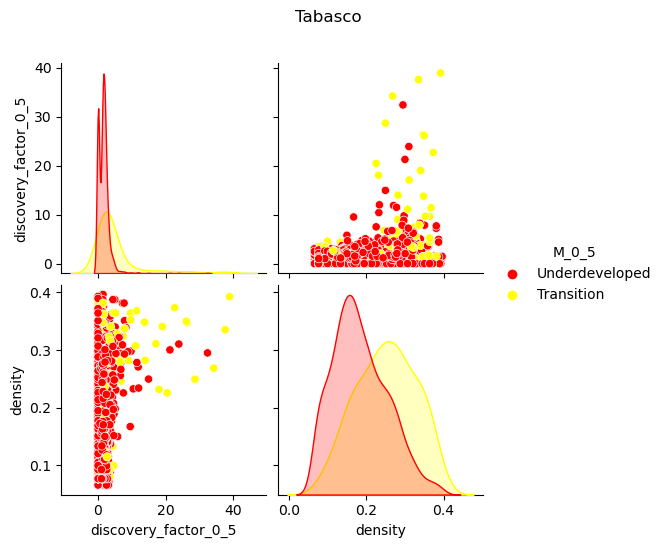

Tamaulipas


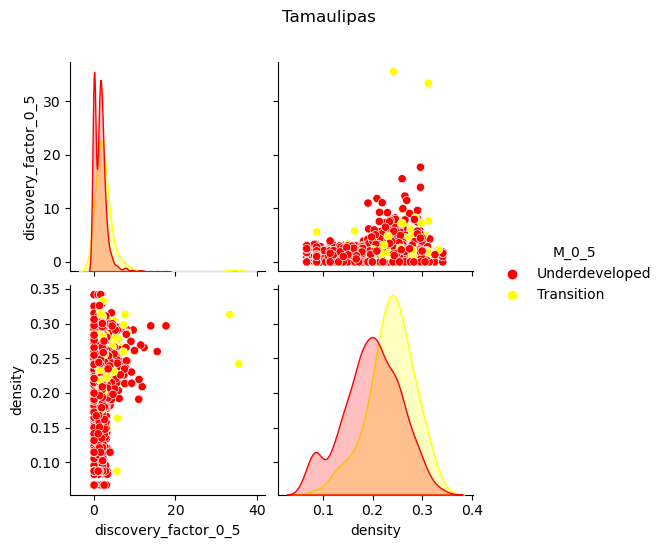

Tlaxcala


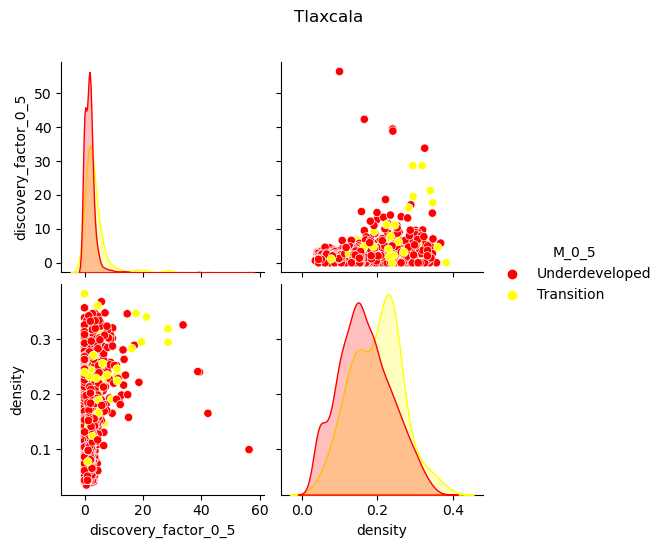

Veracruz


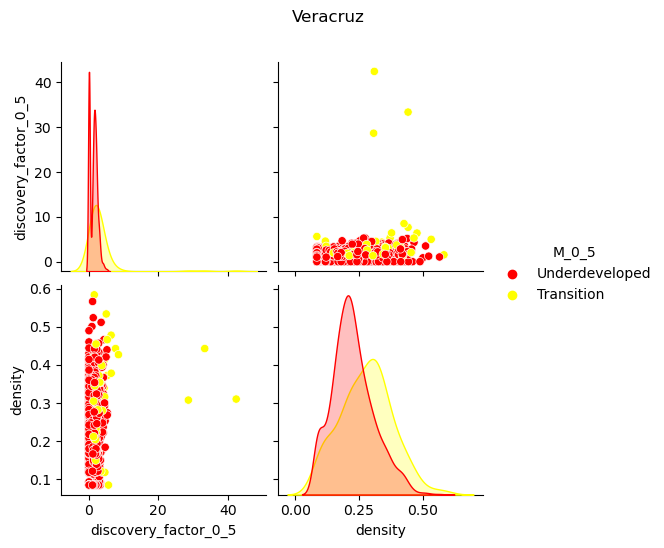

Yucatán


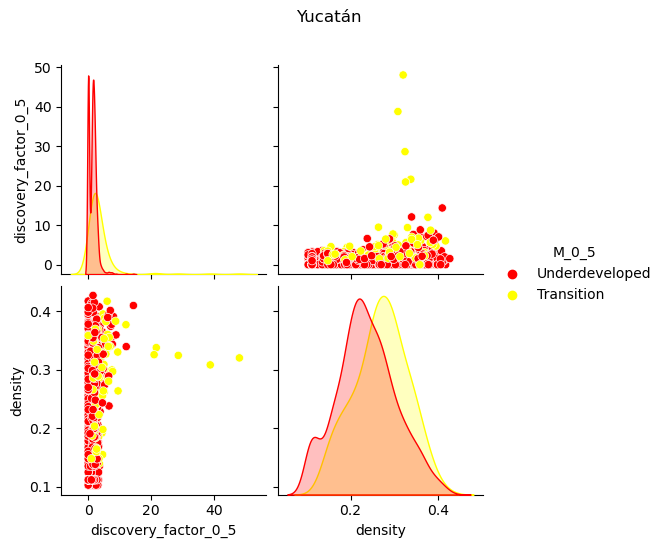

Zacatecas


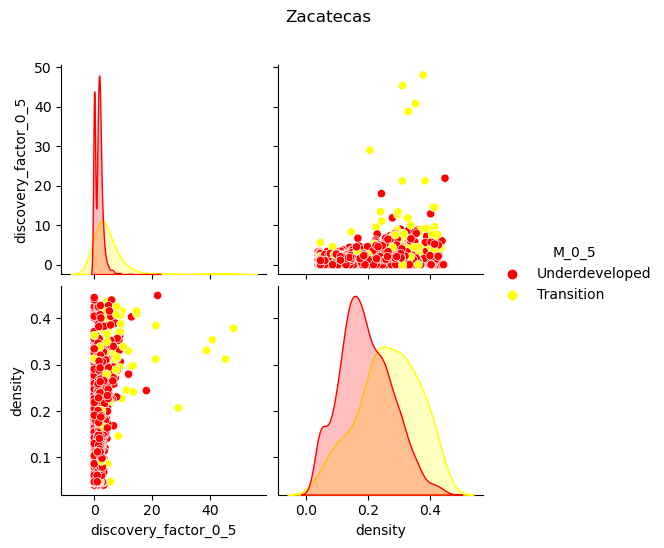

In [19]:
# Feature_array = ['degree_centrality_rca1','discovery_factor_rca1','density','M_0_5']
# Feature_array = ['degree_centrality','discovery_factor_rca1','density','M_'+low_range_str]
Feature_array = ['discovery_factor_'+low_range_str,'density','M_'+low_range_str]

for Edo in Estados:
    Visualize_df = cdata_mex_pairs_under_trans[cdata_mex_pairs_under_trans['location_code'] == Edo][Feature_array]
   # g = sn.pairplot(Visualize_df, hue="M_0_5")
  #  g.fig.suptitle(Edo, y=1.08) # y= some height>1
    print(Edo)
    sn.pairplot(Visualize_df, hue='M_'+low_range_str,palette = {'Underdeveloped':'red','Transition':'yellow'},diag_kind = 'kde',diag_kws = dict(common_norm=False)).fig.suptitle(Edo, y=1.08)
    plt.show()

Aguascalientes


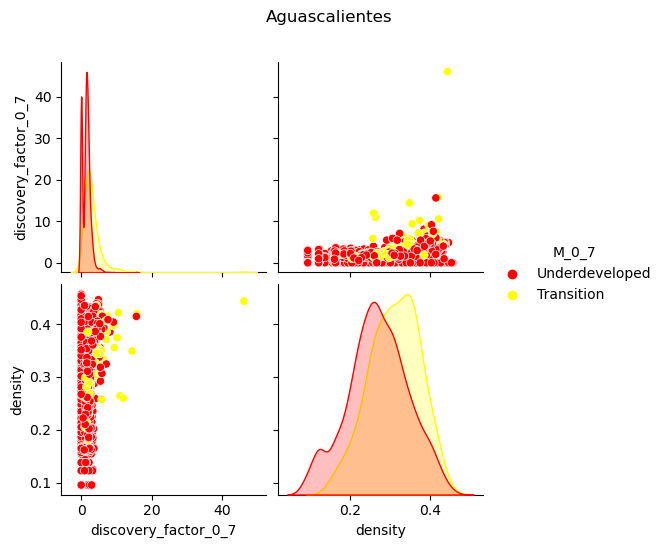

Baja California


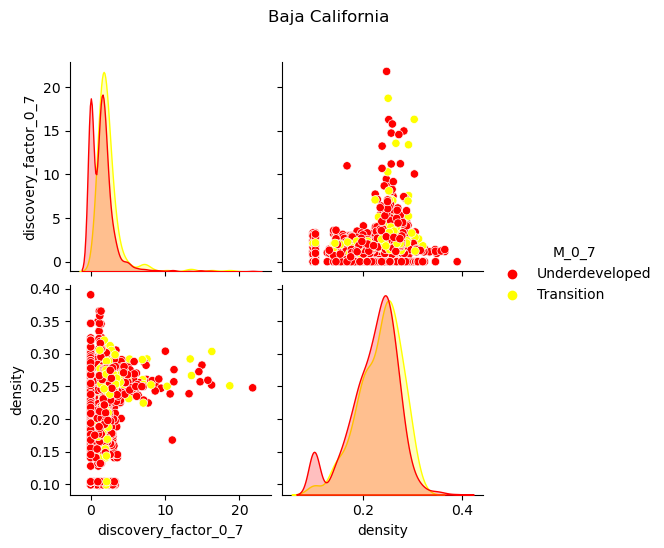

Baja California Sur


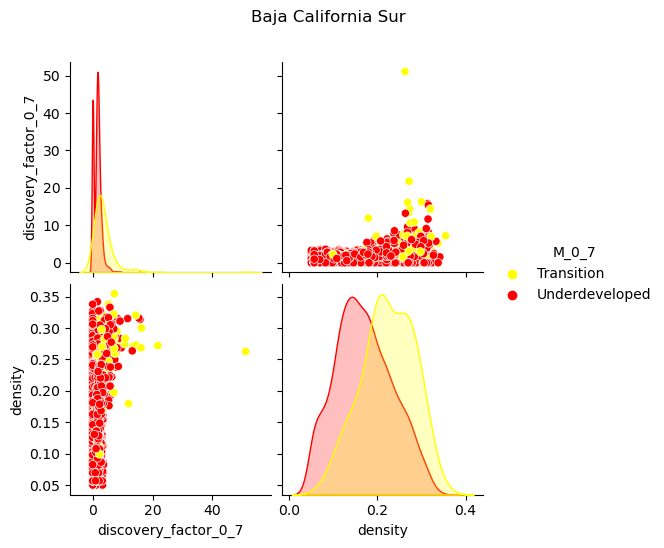

Campeche


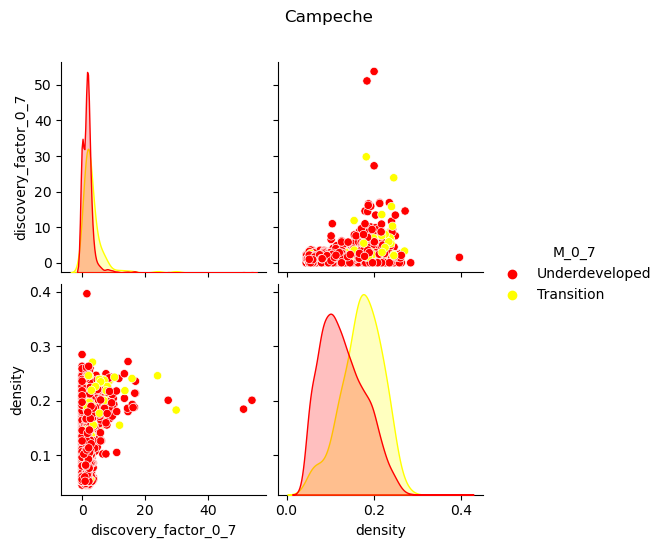

Chiapas


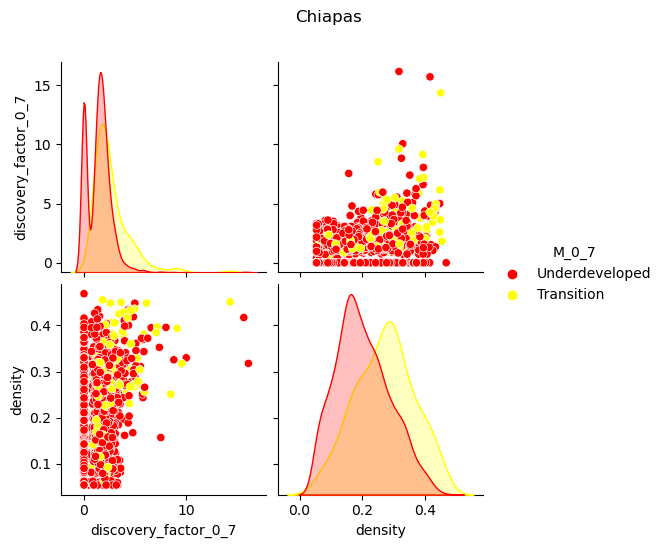

Chihuahua


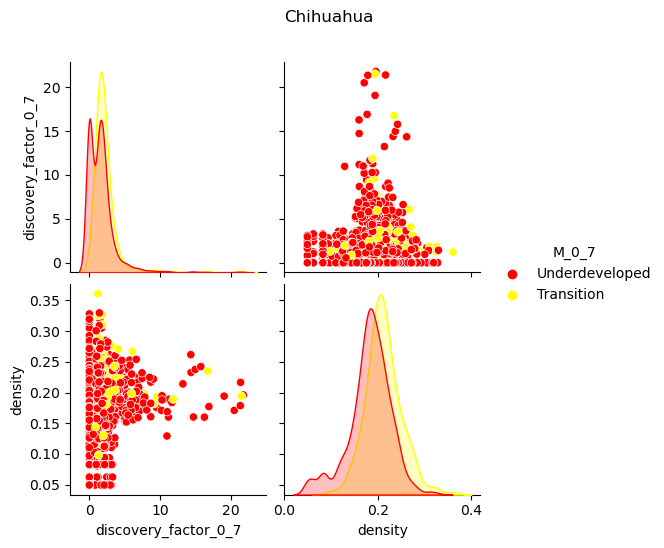

Ciudad de México


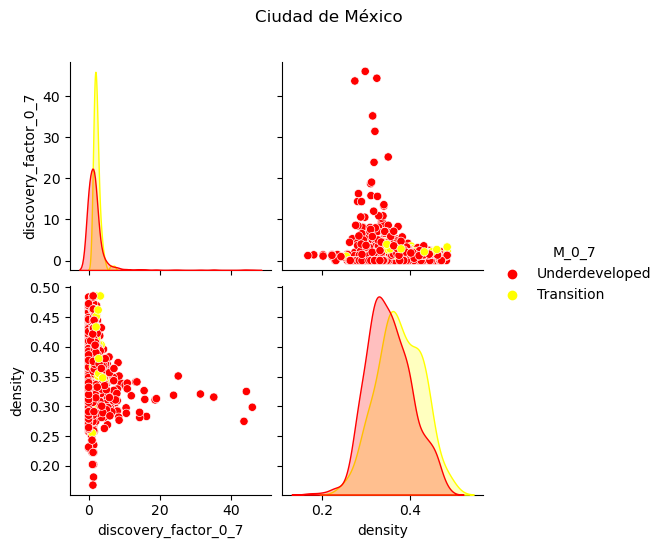

Coahuila


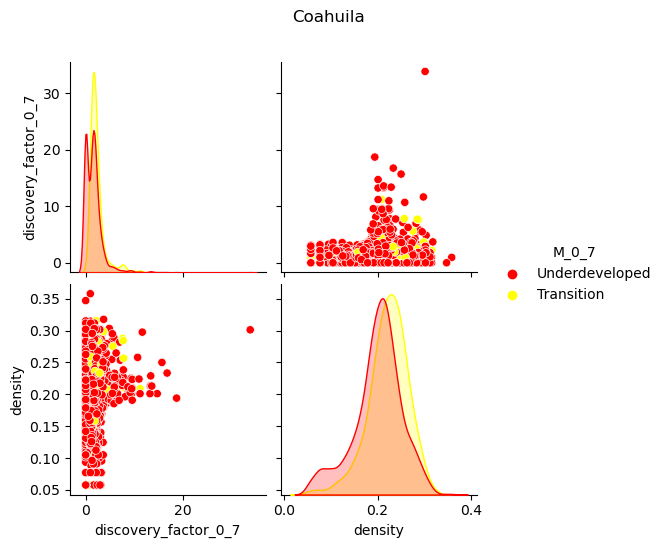

Colima


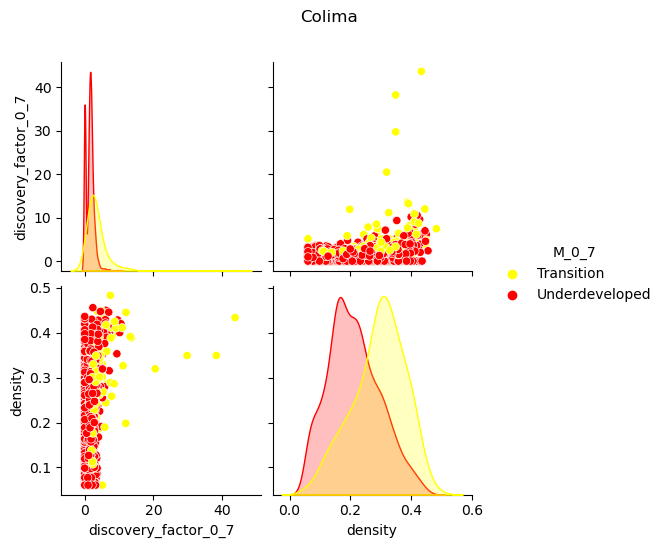

Durango


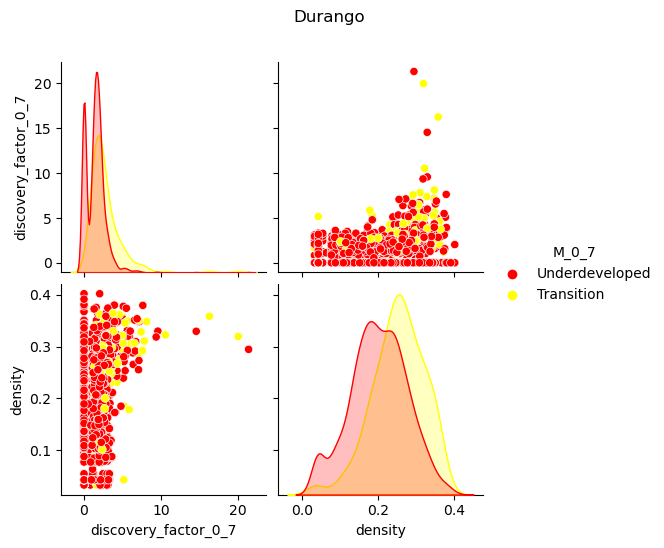

Guanajuato


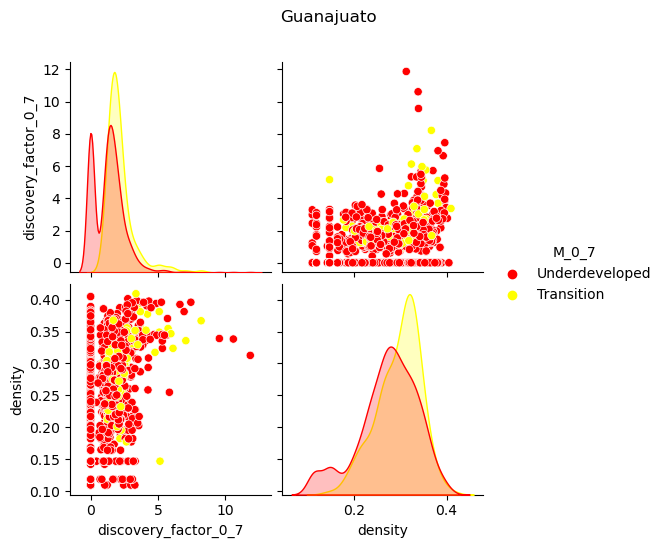

Guerrero


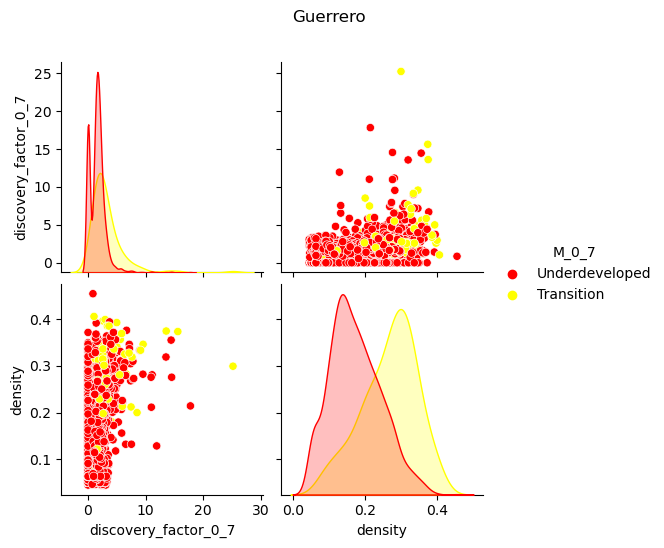

Hidalgo


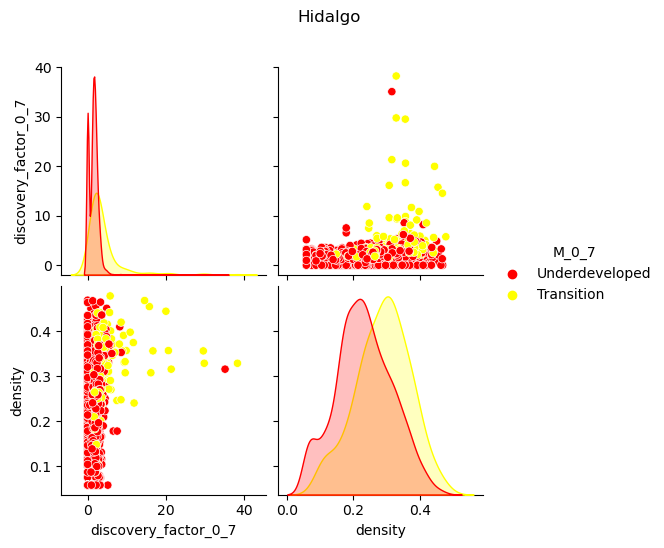

Jalisco


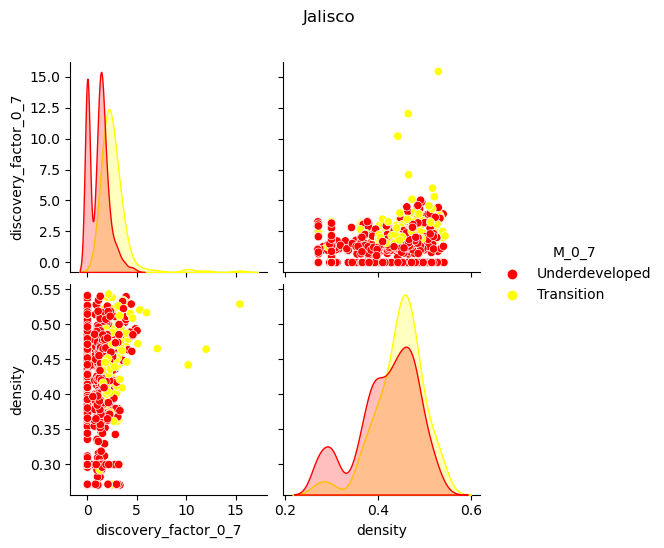

México


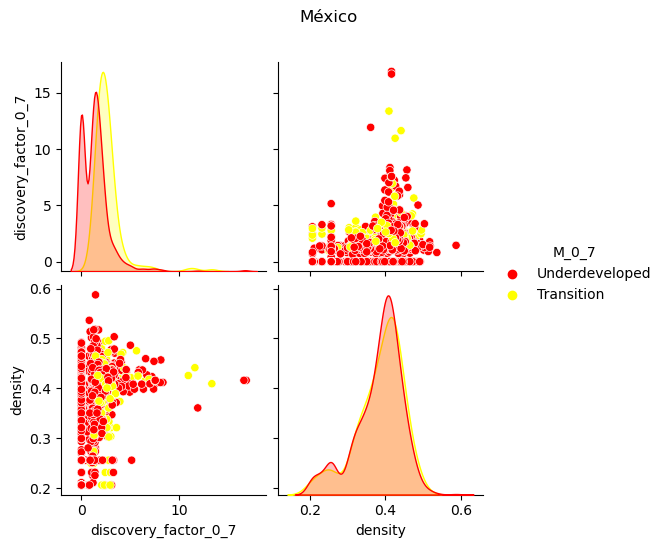

Michoacán


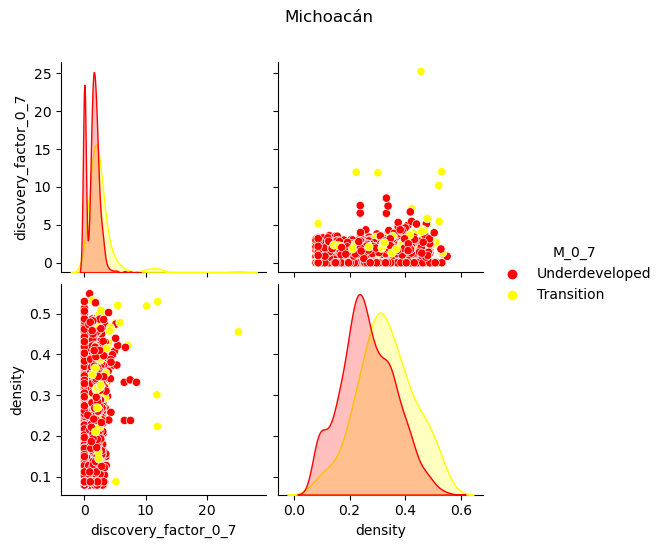

Morelos


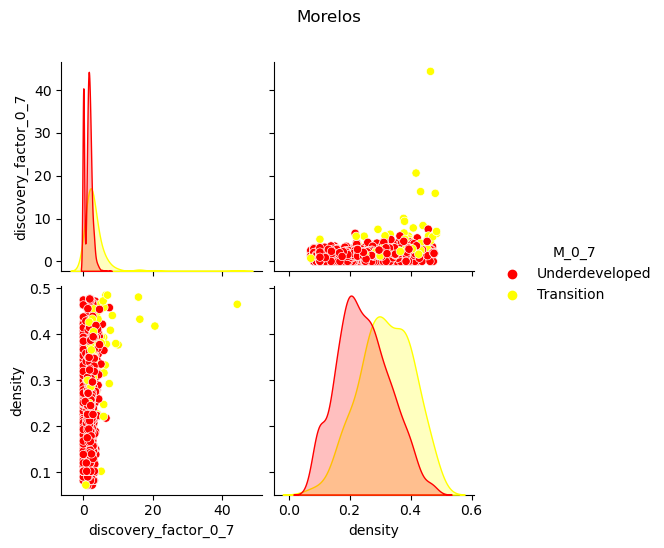

Nayarit


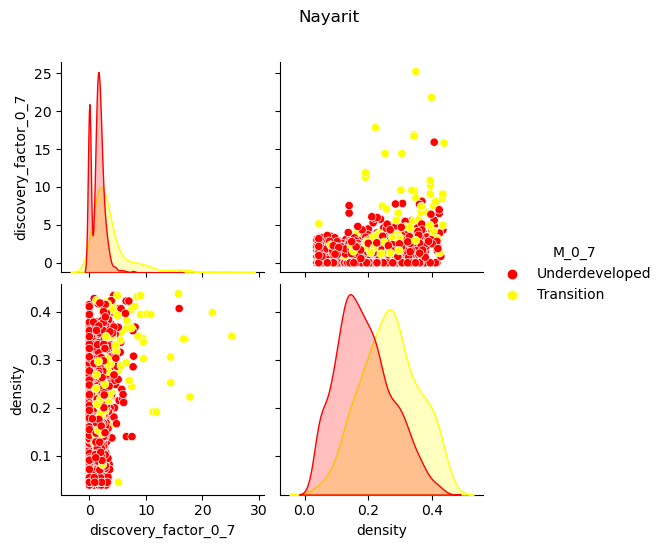

Nuevo León


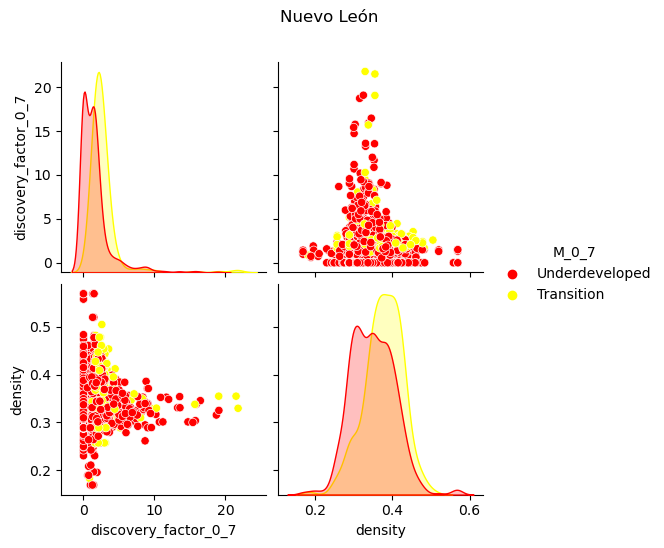

Oaxaca


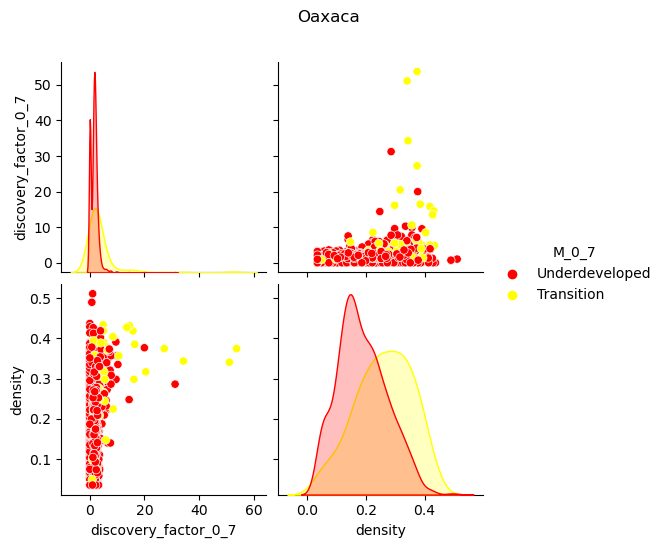

Puebla


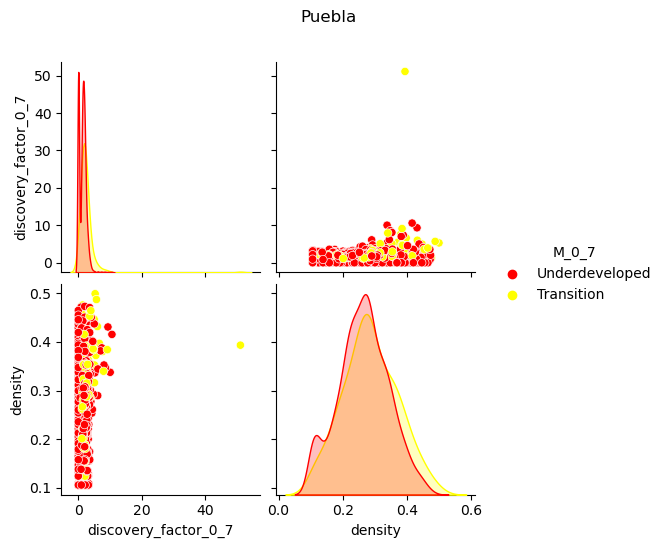

Querétaro


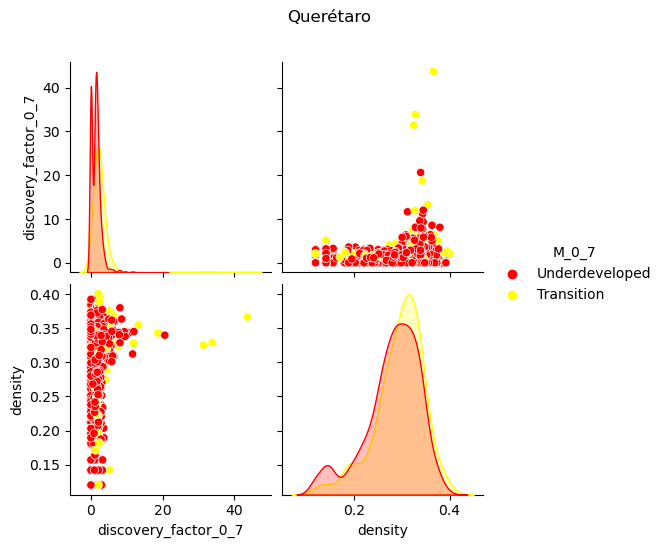

Quintana Roo


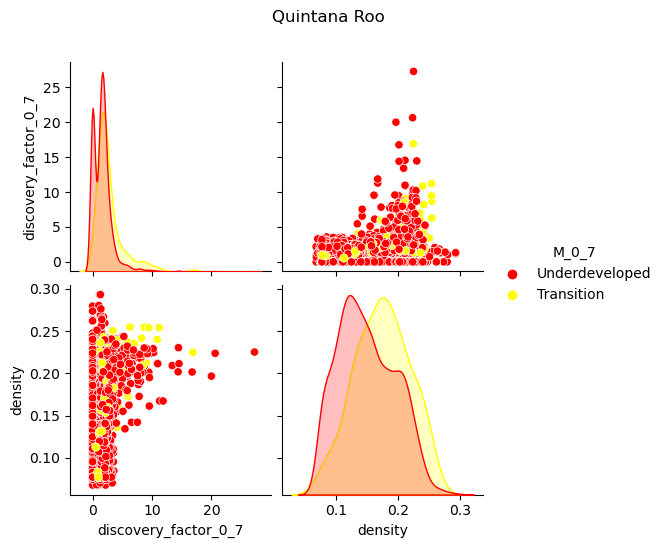

San Luis Potosí


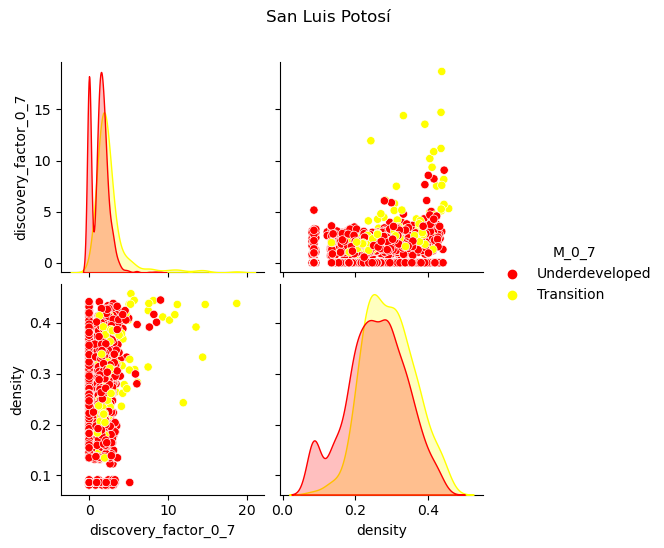

Sinaloa


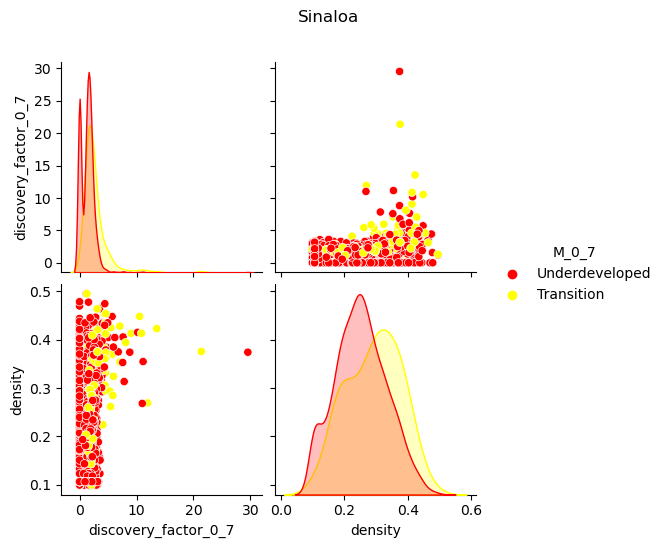

Sonora


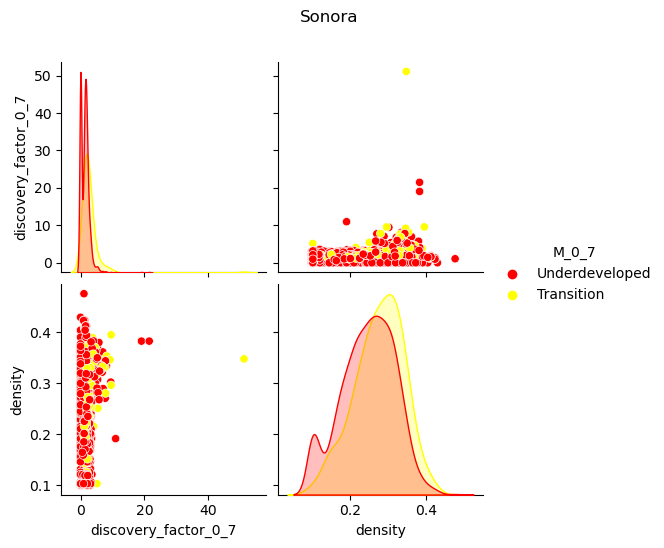

Tabasco


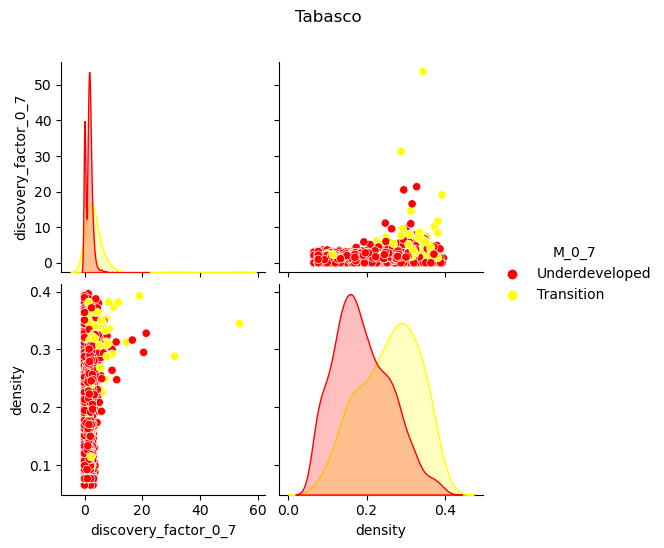

Tamaulipas


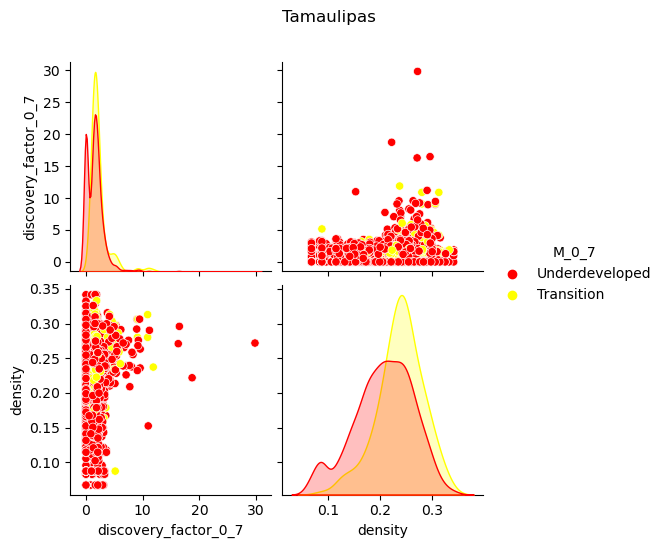

Tlaxcala


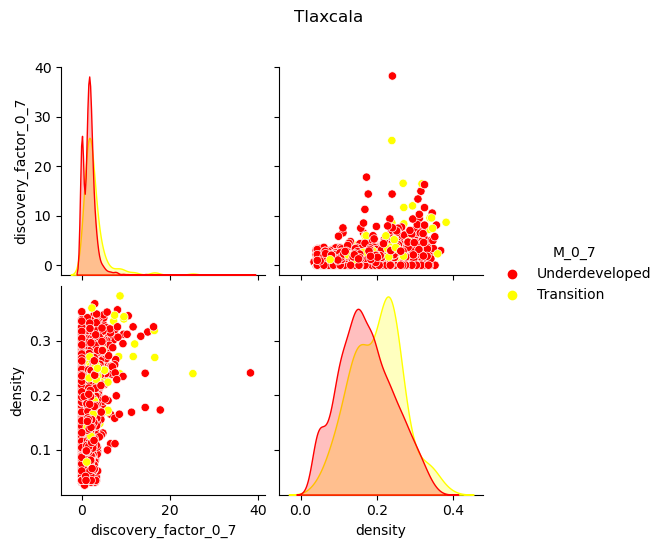

Veracruz


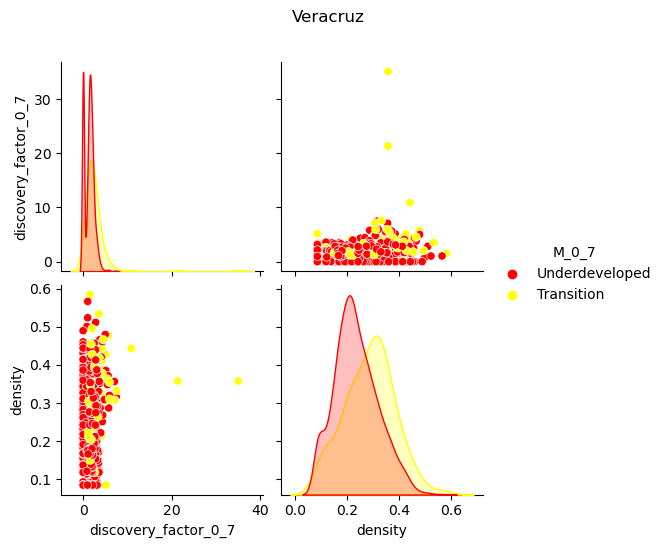

Yucatán


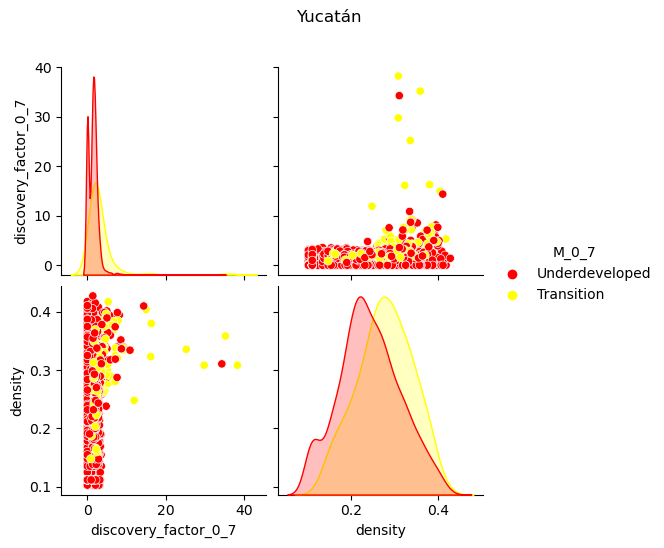

Zacatecas


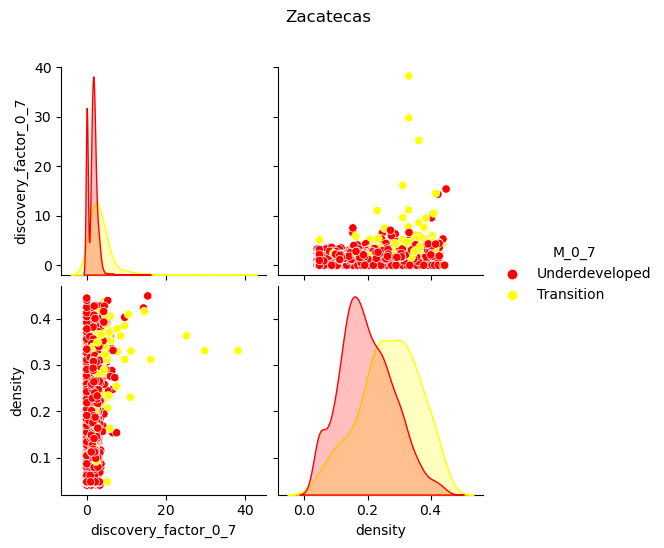

In [20]:
cdata_mex_pairs=pd.read_csv('../output_data/complexity_data_mex_pairs_all.csv')

low_range = 0.7
low_range_str = str(low_range).replace('.','_')
#RCA weighted metrics
cdata_mex_pairs['GPDperCAP_rca1']=cdata_mex_pairs['GPDperCAP']*cdata_mex_pairs['rca1']
cdata_mex_pairs['discovery_factor_rca1']=cdata_mex_pairs['discovery_factor_'+low_range_str]*cdata_mex_pairs['rca1']
cdata_mex_pairs['degree_centrality_rca1']=cdata_mex_pairs['degree_centrality']*cdata_mex_pairs['rca1']
cdata_mex_pairs['eigenvecor_centrality_rca1']=cdata_mex_pairs['eigenvecor_centrality']*cdata_mex_pairs['rca1']
cdata_mex_pairs['closeness_centrality_rca1']=cdata_mex_pairs['closeness_centrality']*cdata_mex_pairs['rca1']


cdata_mex_pairs_under_trans=cdata_mex_pairs.loc[cdata_mex_pairs['M_num_'+low_range_str].isin([0,1])]

# Feature_array = ['degree_centrality','discovery_factor_rca1','density','M_'+low_range_str]

Feature_array = ['discovery_factor_'+low_range_str,'density','M_'+low_range_str]

for Edo in Estados:
    Visualize_df = cdata_mex_pairs_under_trans[cdata_mex_pairs_under_trans['location_code'] == Edo][Feature_array]
   # g = sn.pairplot(Visualize_df, hue="M_0_5")
  #  g.fig.suptitle(Edo, y=1.08) # y= some height>1
    print(Edo)
    sn.pairplot(Visualize_df, hue='M_'+low_range_str,palette = {'Underdeveloped':'red','Transition':'yellow'},diag_kind = 'kde',diag_kws = dict(common_norm=False)).fig.suptitle(Edo, y=1.08)
    plt.show()

Aguascalientes


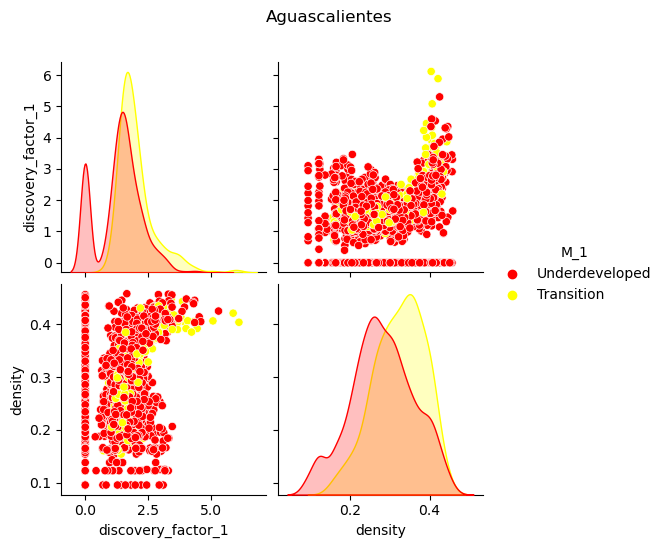

Baja California


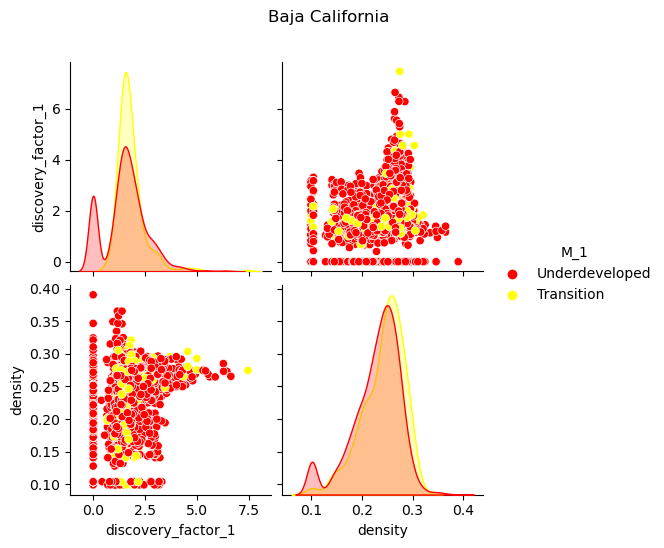

Baja California Sur


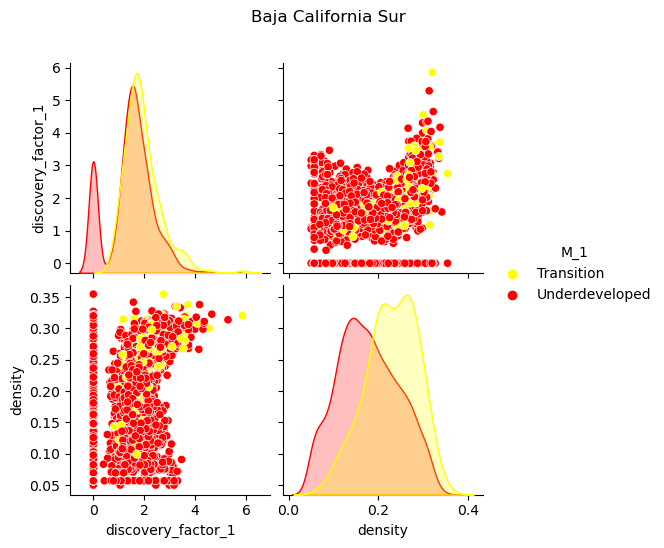

Campeche


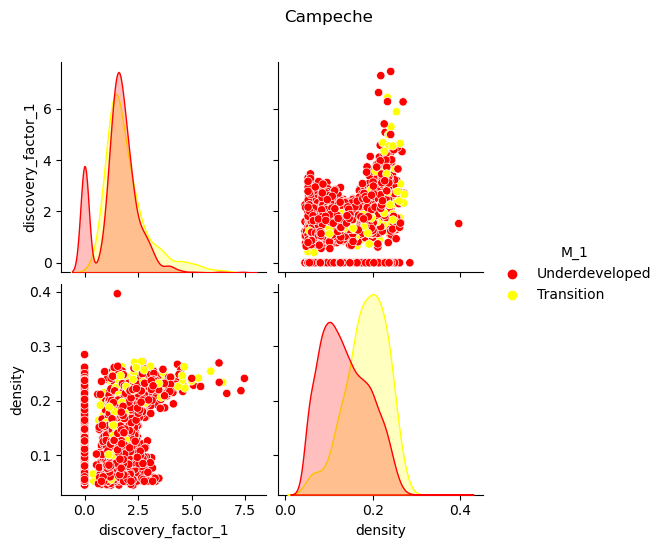

Chiapas


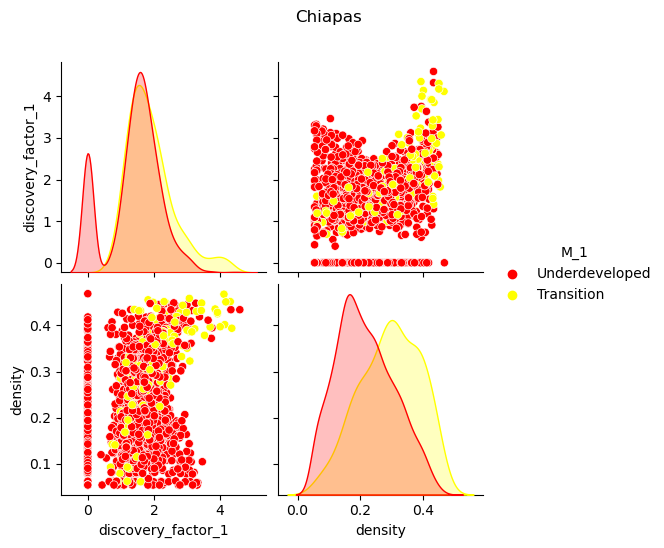

Chihuahua


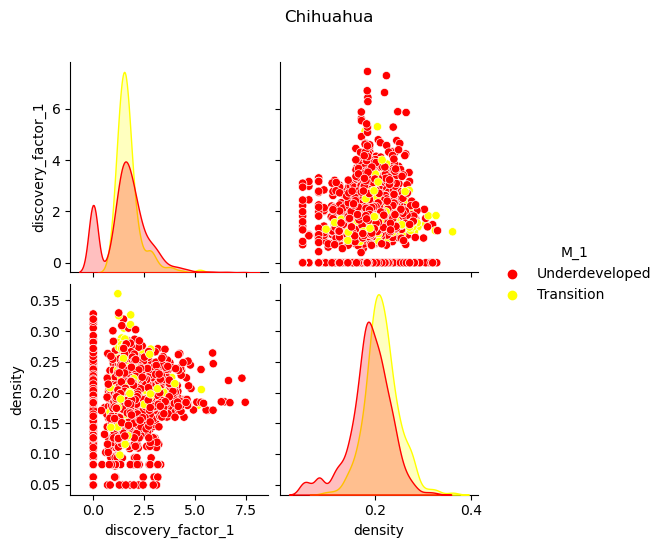

Ciudad de México


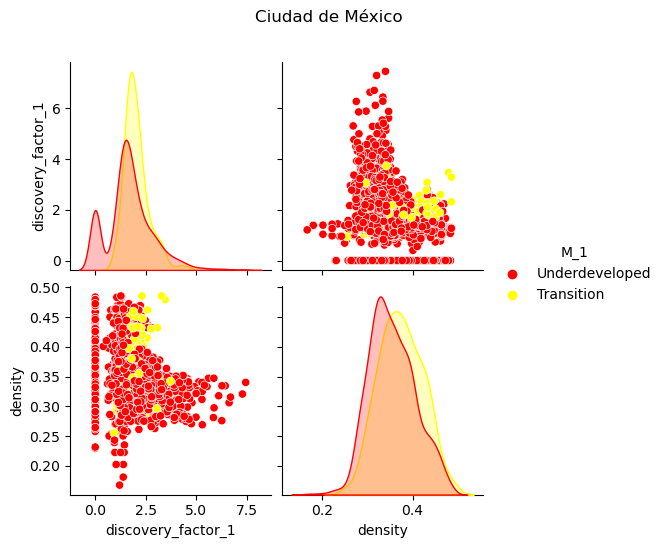

Coahuila


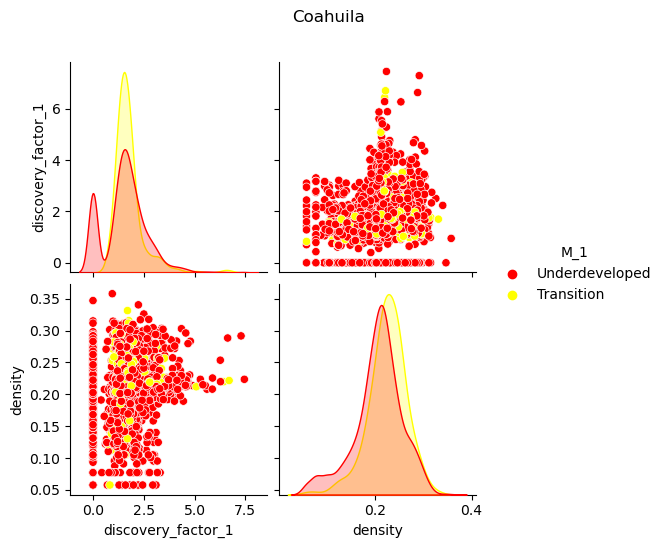

Colima


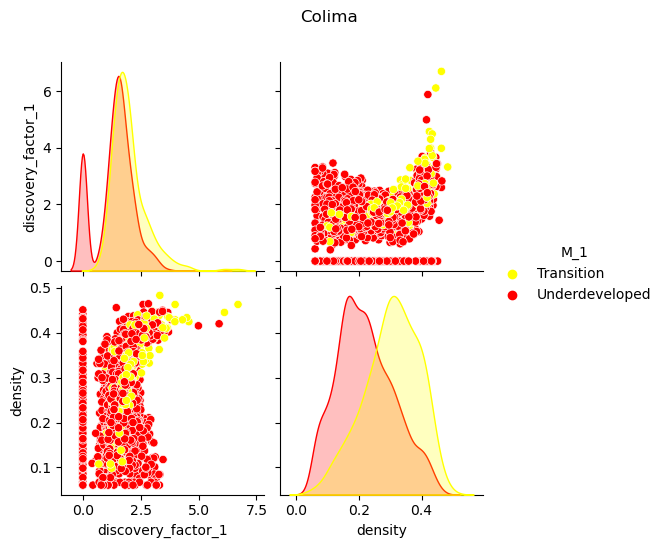

Durango


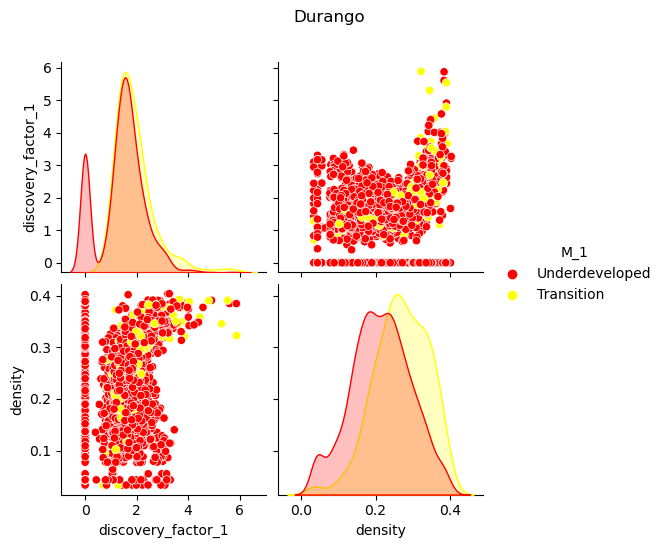

Guanajuato


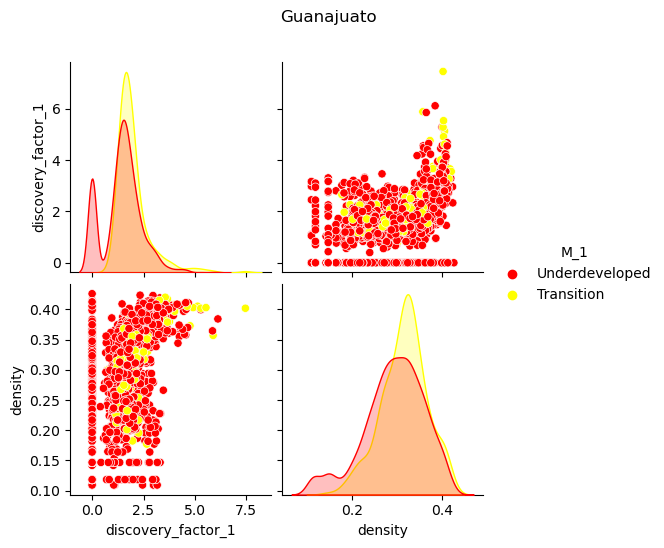

Guerrero


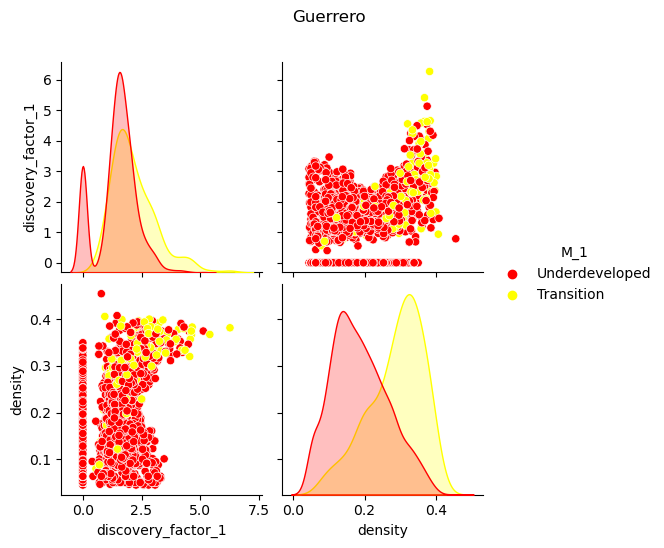

Hidalgo


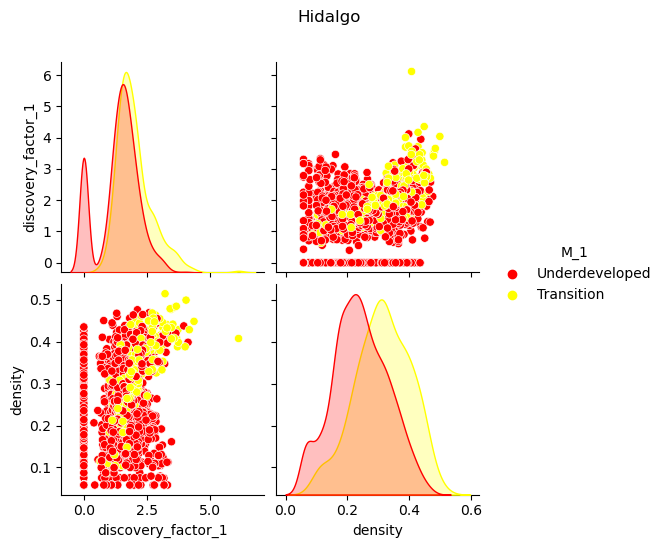

Jalisco


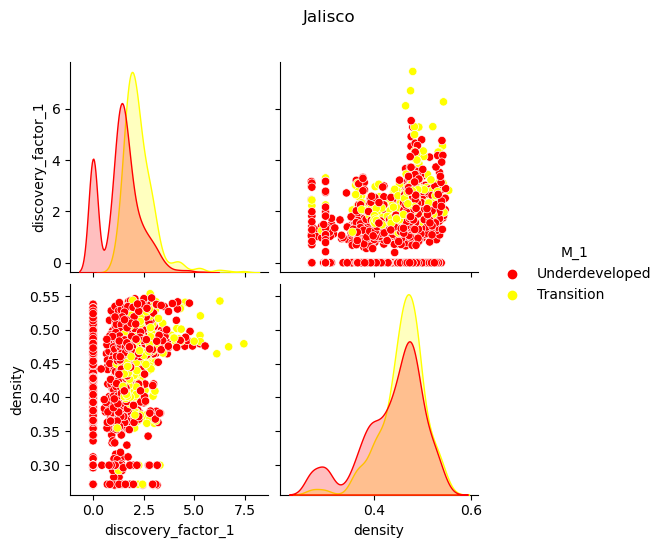

México


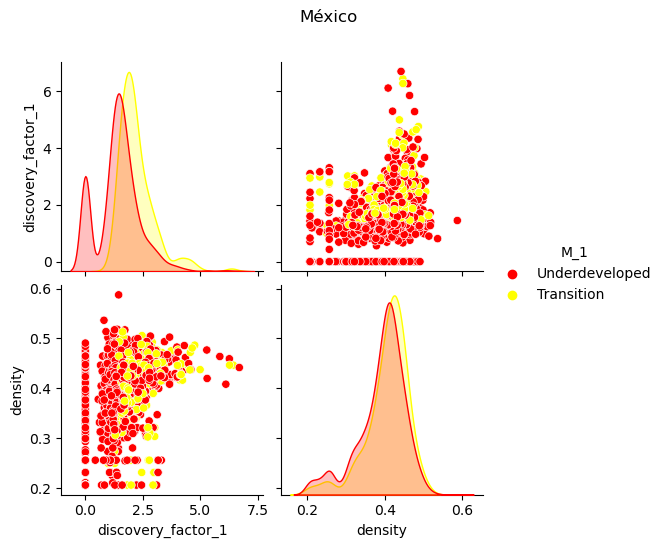

Michoacán


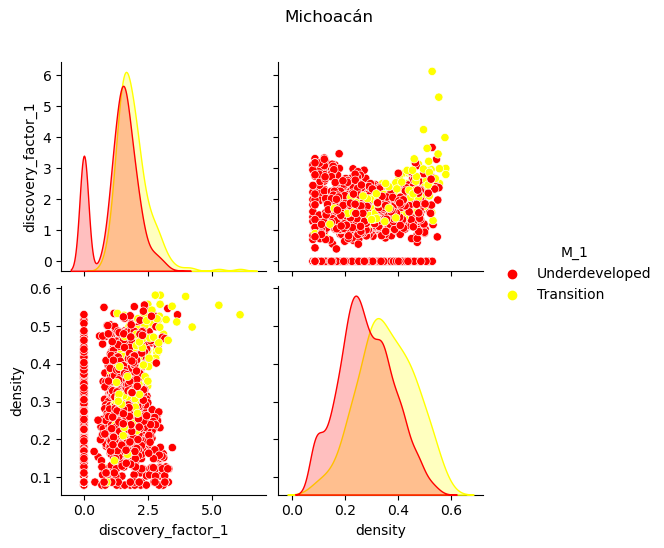

Morelos


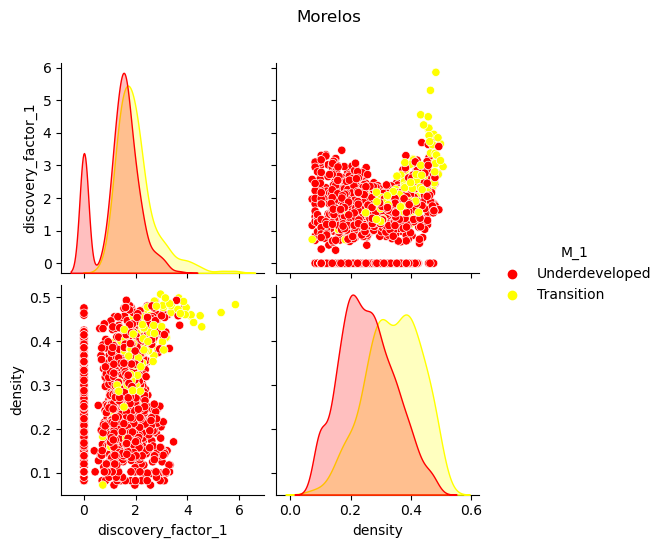

Nayarit


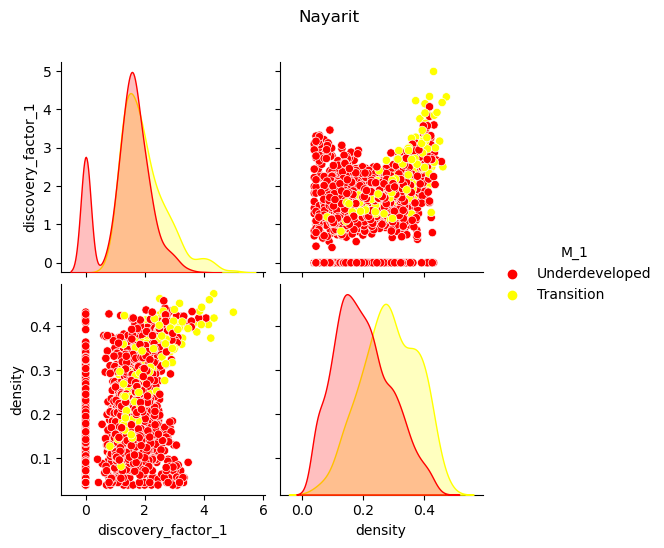

Nuevo León


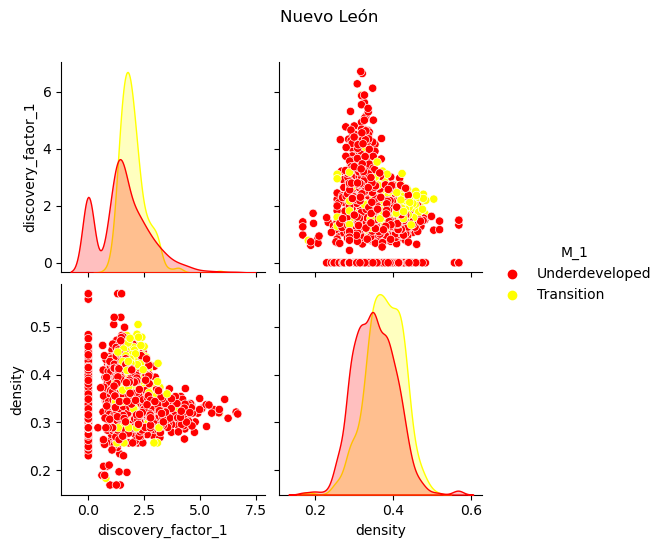

Oaxaca


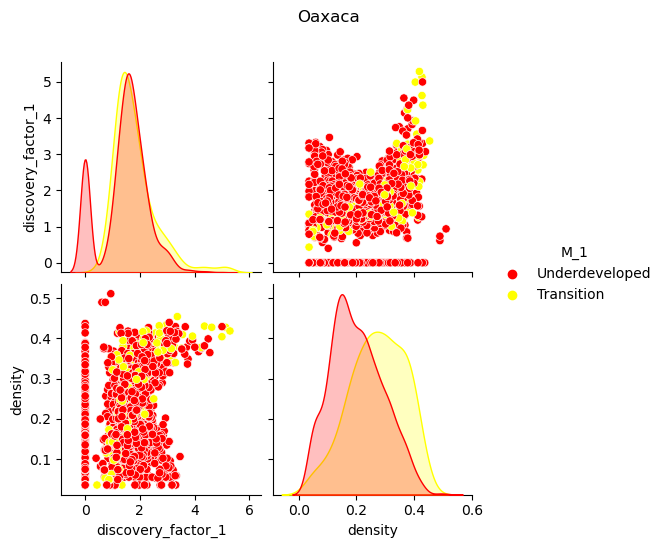

Puebla


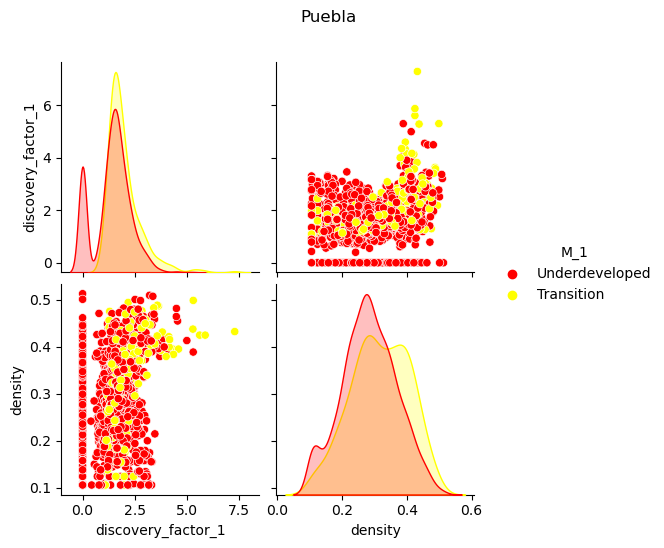

Querétaro


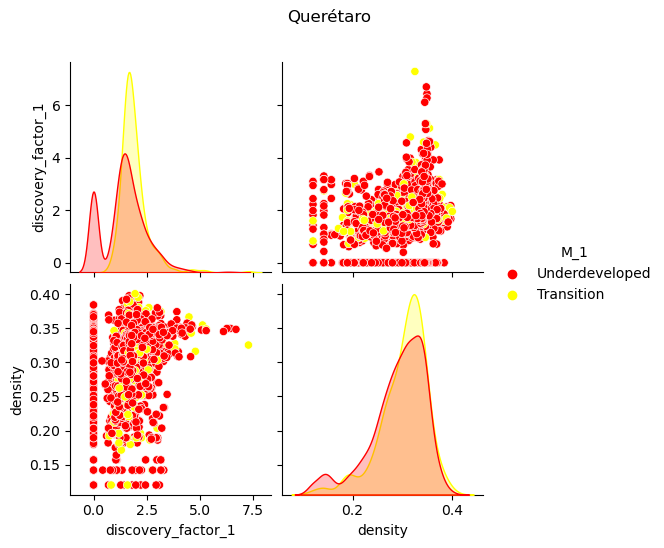

Quintana Roo


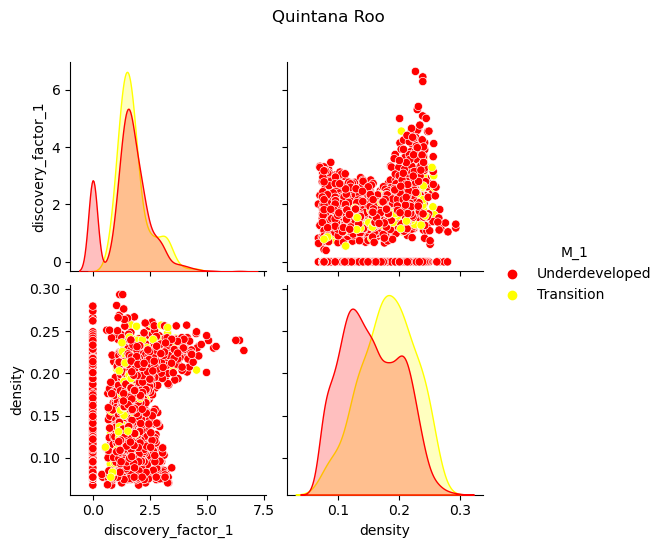

San Luis Potosí


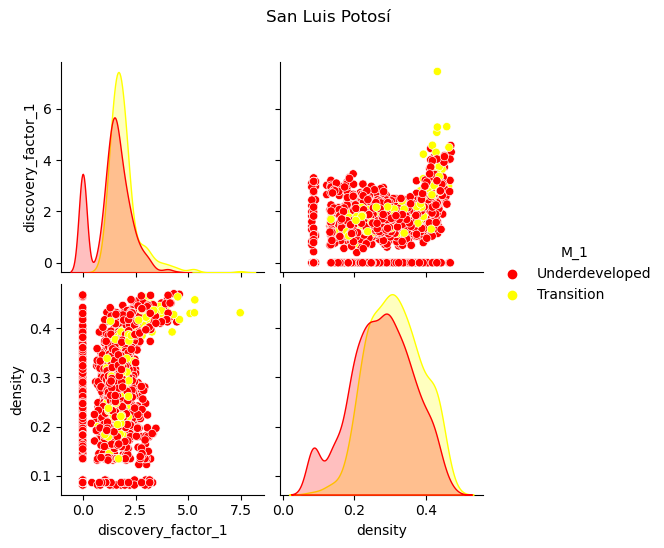

Sinaloa


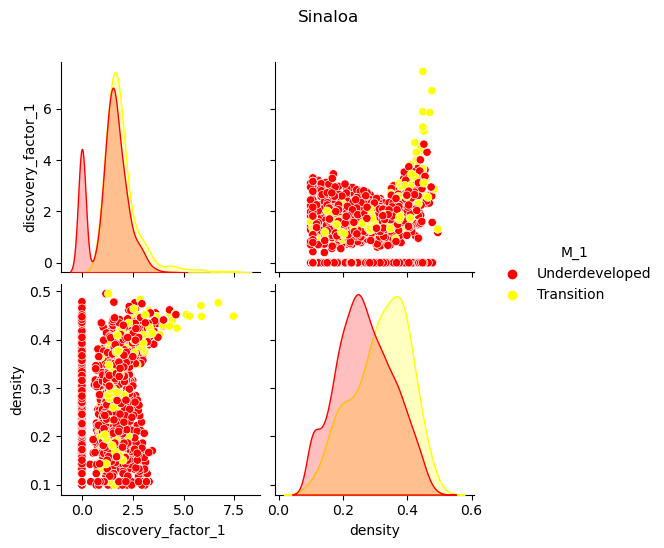

Sonora


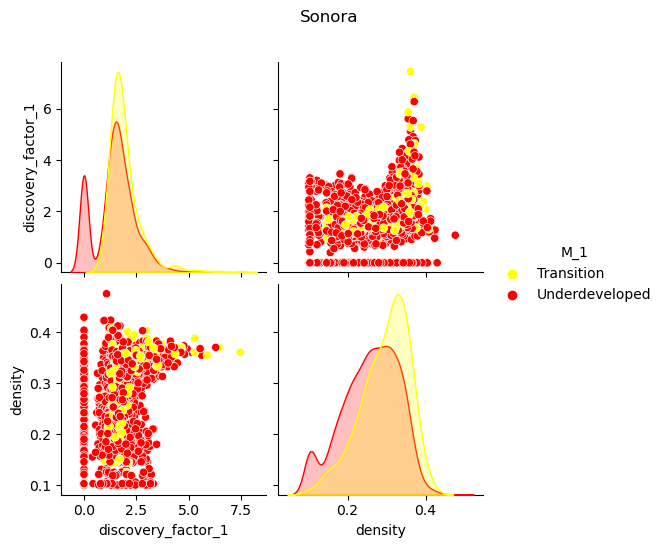

Tabasco


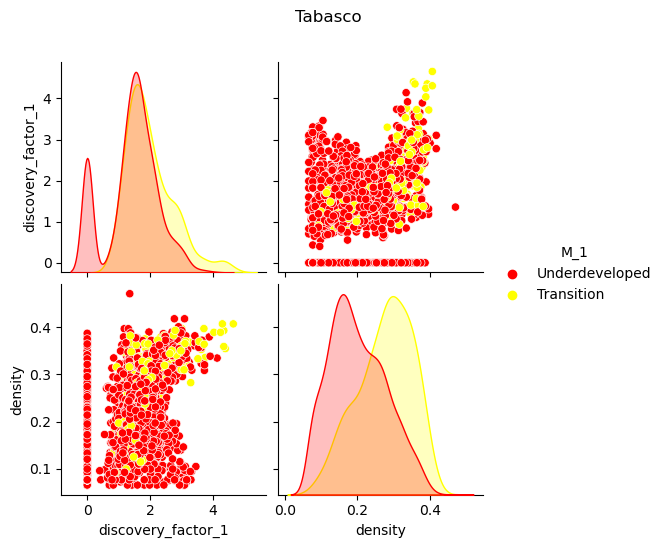

Tamaulipas


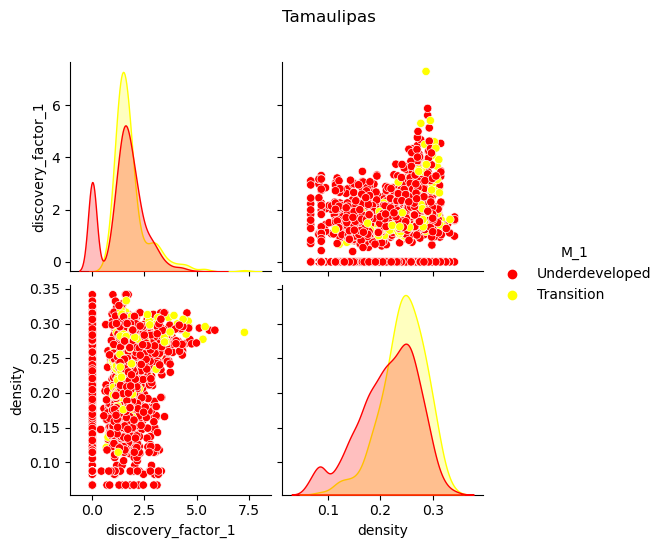

Tlaxcala


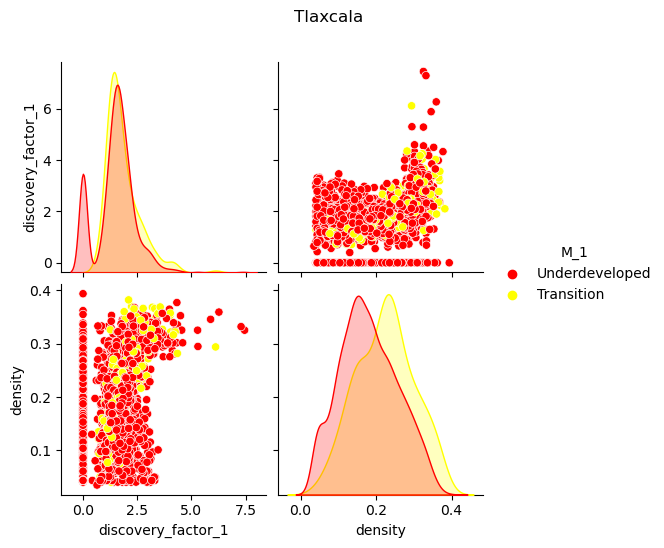

Veracruz


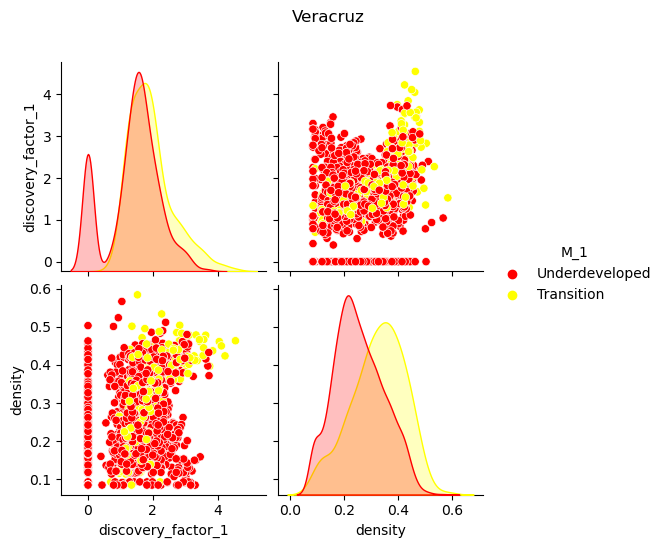

Yucatán


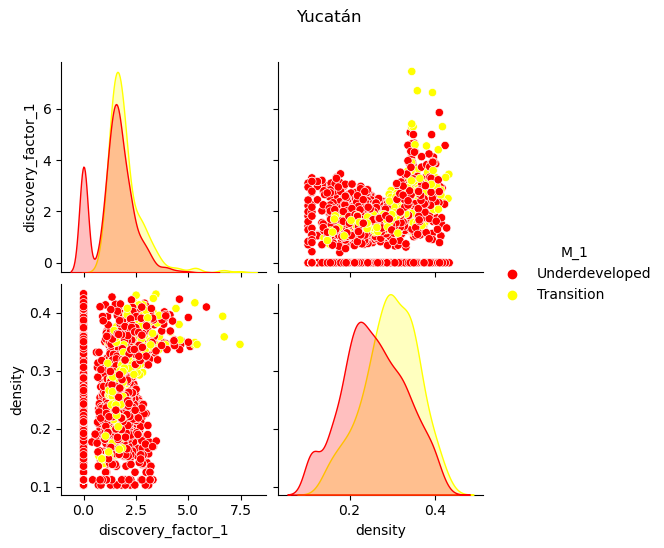

Zacatecas


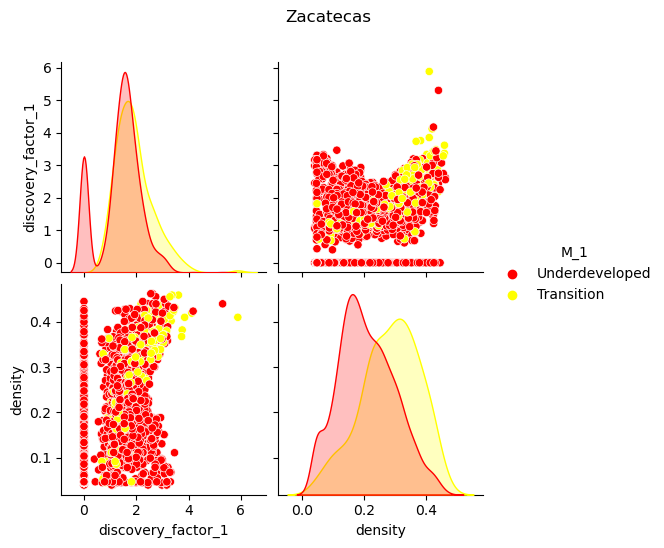

In [21]:
cdata_mex_pairs=pd.read_csv('../output_data/complexity_data_mex_pairs_all.csv')

low_range = 1
low_range_str = str(low_range).replace('.','_')
#RCA weighted metrics
cdata_mex_pairs['GPDperCAP_rca1']=cdata_mex_pairs['GPDperCAP']*cdata_mex_pairs['rca1']
cdata_mex_pairs['discovery_factor_rca1']=cdata_mex_pairs['discovery_factor_'+low_range_str]*cdata_mex_pairs['rca1']
cdata_mex_pairs['degree_centrality_rca1']=cdata_mex_pairs['degree_centrality']*cdata_mex_pairs['rca1']
cdata_mex_pairs['eigenvecor_centrality_rca1']=cdata_mex_pairs['eigenvecor_centrality']*cdata_mex_pairs['rca1']
cdata_mex_pairs['closeness_centrality_rca1']=cdata_mex_pairs['closeness_centrality']*cdata_mex_pairs['rca1']


cdata_mex_pairs_under_trans=cdata_mex_pairs.loc[cdata_mex_pairs['M_num_'+low_range_str].isin([0,1])]

Feature_array = ['degree_centrality','discovery_factor_rca1','density','M_'+low_range_str]
Feature_array = ['discovery_factor_'+low_range_str,'density','M_'+low_range_str]

for Edo in Estados:
    Visualize_df = cdata_mex_pairs_under_trans[cdata_mex_pairs_under_trans['location_code'] == Edo][Feature_array]
   # g = sn.pairplot(Visualize_df, hue="M_0_5")
  #  g.fig.suptitle(Edo, y=1.08) # y= some height>1
    print(Edo)
    sn.pairplot(Visualize_df, hue='M_'+low_range_str,palette = {'Underdeveloped':'red','Transition':'yellow'},diag_kind = 'kde',diag_kws = dict(common_norm=False)).fig.suptitle(Edo, y=1.08)
    plt.show()

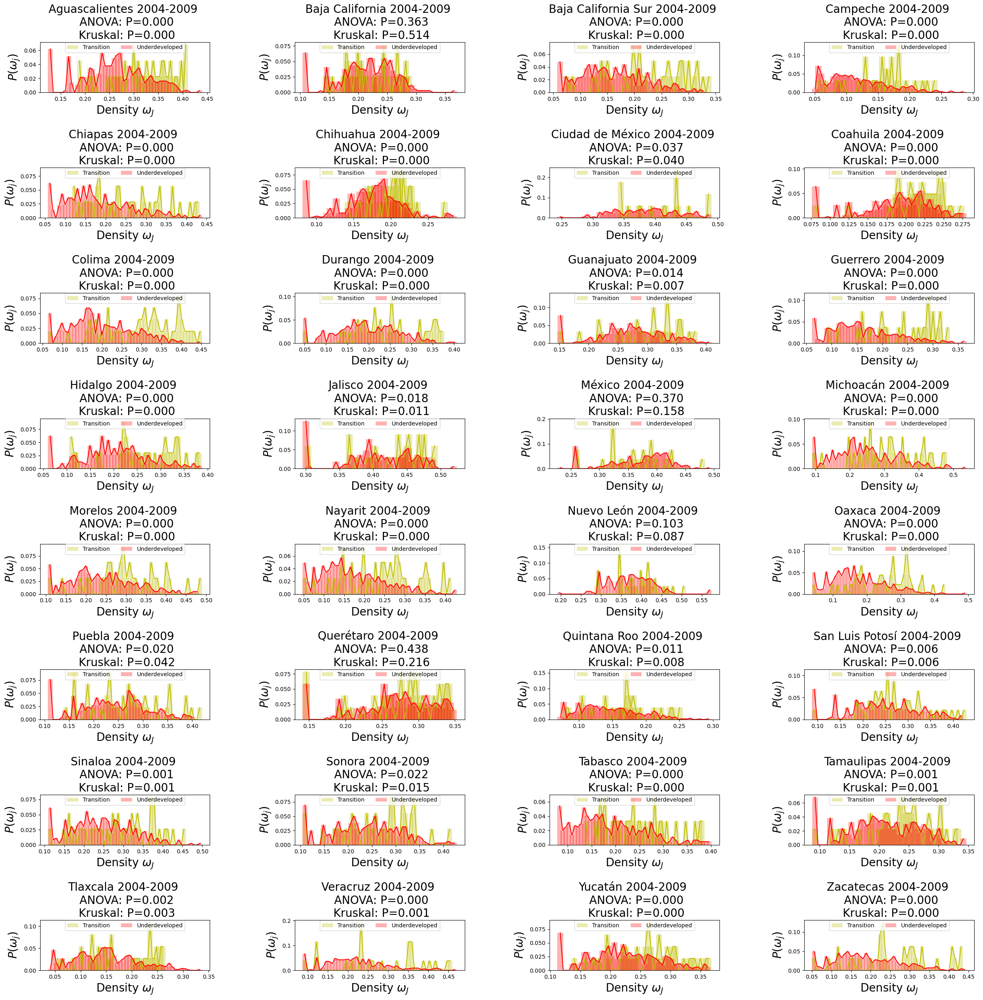

,Estado,Periodo,ANOVA_flag,Kruskal_flag
0,Aguascalientes,2004-2009,1,1
1,Baja California,2004-2009,0,0
2,Baja California Sur,2004-2009,1,1
3,Campeche,2004-2009,1,1
4,Chiapas,2004-2009,1,1
5,Chihuahua,2004-2009,1,1
6,Ciudad de México,2004-2009,1,1
7,Coahuila,2004-2009,1,1
8,Colima,2004-2009,1,1
9,Durango,2004-2009,1,1


In [25]:
from scipy.stats import f_oneway
from scipy.stats import kruskal

fig, axs = plt.subplots(8,4, figsize=(30, 30), facecolor='w', edgecolor='k')
# fig, axs = plt.subplots(3,3, figsize=(15, 15), facecolor='w', edgecolor='k')

fig.subplots_adjust(hspace = 1.5, wspace=0.5)

axs = axs.ravel()
cdata_mex_pairs=pd.read_csv('../output_data/complexity_data_mex_pairs_all.csv')

low_range = 0.5
low_range_str = str(low_range).replace('.','_')
#RCA weighted metrics
cdata_mex_pairs['GPDperCAP_rca1']=cdata_mex_pairs['GPDperCAP']*cdata_mex_pairs['rca1']
cdata_mex_pairs['discovery_factor_rca1']=cdata_mex_pairs['discovery_factor_'+low_range_str]*cdata_mex_pairs['rca1']
cdata_mex_pairs['degree_centrality_rca1']=cdata_mex_pairs['degree_centrality']*cdata_mex_pairs['rca1']
cdata_mex_pairs['eigenvecor_centrality_rca1']=cdata_mex_pairs['eigenvecor_centrality']*cdata_mex_pairs['rca1']
cdata_mex_pairs['closeness_centrality_rca1']=cdata_mex_pairs['closeness_centrality']*cdata_mex_pairs['rca1']


cdata_mex_pairs_under_trans=cdata_mex_pairs.loc[cdata_mex_pairs['M_num_'+low_range_str].isin([0,1])]

year_pair='2004_2009'
year1=int(year_pair[0:4])
year2=int(year_pair[5:])

year_df = cdata_mex_pairs_under_trans[cdata_mex_pairs_under_trans['year_pair'] == year_pair]

metric = 'density'


est_per_p_val=[]


for i,Estado in enumerate(Estados):
    
  
    
    #Get metric of transition and underdeveloped products
    
    state_df = year_df[year_df['location_code'] == Estado]
    
    dens_trans = state_df[state_df['M_num_'+low_range_str] == 1][metric].values
    
    dens_under = state_df[state_df['M_num_'+low_range_str] == 0][metric].values
    
    
    
    bins=50
    
    #Histogram desity

    count_dens_trans,base_dens_trans = np.histogram(dens_trans, bins=bins,density=False)
    
    #Probability
    prob_dens_trans = count_dens_trans/len(dens_trans)

    count_dens_under,base_dens_under = np.histogram(dens_under, bins=bins,density=False)
    #Probability
    
    prob_dens_under = count_dens_under/len(dens_under)

    f_stat_ANOVA, p_valor_ANOVA = f_oneway(dens_trans, dens_under)
    f_stat_kruskal, p_valor_kruskal = kruskal(dens_trans, dens_under)


    #print("Estadístico F:", dens_trans)
    #print("Valor P:", dens_under)

    #plt.plot(base_dens_trans[1:len(base_dens_trans)],prob_dens_trans,'y',label= 'Transition')

    #plt.plot(base_dens_under[1:len(base_dens_under)],prob_dens_under,'r',label= 'Underdeveloped')

    #plt.xlabel(r'$\omega_j$',size=20)
    #plt.ylabel(r'$P(\omega_j)$',size=20)
    #plt.title(Estado+f' {year1}-{year2} \n ANOVA: P={p_valor_ANOVA:.3f}\n Kruskal: P={p_valor_kruskal:.3f}',size=20)
    #plt.legend()
    #plt.show()
    
    axs[i].plot(base_dens_trans[1:len(base_dens_trans)],prob_dens_trans,'y')
    axs[i].bar(base_dens_trans[1:len(base_dens_trans)],prob_dens_trans,
               alpha=0.3,width=0.01,color='y',label= 'Transition')
    
    axs[i].plot(base_dens_under[1:len(base_dens_under)],prob_dens_under,'r')
    axs[i].bar(base_dens_under[1:len(base_dens_under)],prob_dens_under,
               alpha=0.3,width=0.01,color='r',label= 'Underdeveloped')
    
    
    axs[i].set_xlabel(r'Density $\omega_J$',size=20)
    axs[i].set_ylabel(r'$P(\omega_j)$',size=20)
    axs[i].set_title(Estado+f' {year1}-{year2} \n ANOVA: P={p_valor_ANOVA:.3f}\n Kruskal: P={p_valor_kruskal:.3f}'
                     ,size=20)
    axs[i].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),
          ncol=2)
    
    p_anova_flag=1
    if p_valor_ANOVA>0.05:
        #print(Estado+f' {year1}-{year2} \n ANOVA: P={p_valor_ANOVA:.3f}\n Kruskal: P={p_valor_kruskal:.3f}')
        p_anova_flag=0
        
    p_kruskal_flag=1
    if p_valor_kruskal>0.05:
        #print(Estado+f' {year1}-{year2} \n ANOVA: P={p_valor_ANOVA:.3f}\n Kruskal: P={p_valor_kruskal:.3f}')
        p_kruskal_flag=0
    
    period_str=f'{year1}-{year2}'
        
    est_per_p_val.append([Estado,period_str,p_anova_flag,p_kruskal_flag])
    
plt.show()
    
df_04_19=pd.DataFrame(est_per_p_val,columns=['Estado','Periodo','ANOVA_flag','Kruskal_flag'])
df_04_19
